# Problem:

# For this particular assignment, the data of different types of wine sales in the 20th century is to be analysed. Both of these data are from the same company but of different wines. As an analyst in the ABC Estate Wines, you are tasked to analyse and forecast Wine Sales in the 20th century.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

# Question 1

# Read the data as an appropriate Time Series data and plot the data.

In [3]:
Sparkling = pd.read_csv("Sparkling.csv",parse_dates=True,index_col=0)

In [5]:
Sparkling.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


In [6]:
Sparkling.tail()

,Sparkling
YearMonth,
1995-03-01,1897
1995-04-01,1862
1995-05-01,1670
1995-06-01,1688
1995-07-01,2031


In [9]:
Sparkling.describe()

,Sparkling
count,187.000000
mean,2402.417112
std,1295.111540
min,1070.000000
25%,1605.000000
50%,1874.000000
75%,2549.000000
max,7242.000000


In [10]:
Sparkling.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-01 to 1995-07-01
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   Sparkling  187 non-null    int64
dtypes: int64(1)
memory usage: 2.9 KB


In [178]:
Sparkling.shape

(187, 1)

In [11]:
Sparkling.isnull().sum()

Sparkling    0
dtype: int64

In [13]:
Sparkling.duplicated().sum()

11

# Question 2

# Perform appropriate Exploratory Data Analysis to understand the data and also perform decomposition.

In [7]:
from pylab import rcParams
rcParams['figure.figsize'] = 20,8

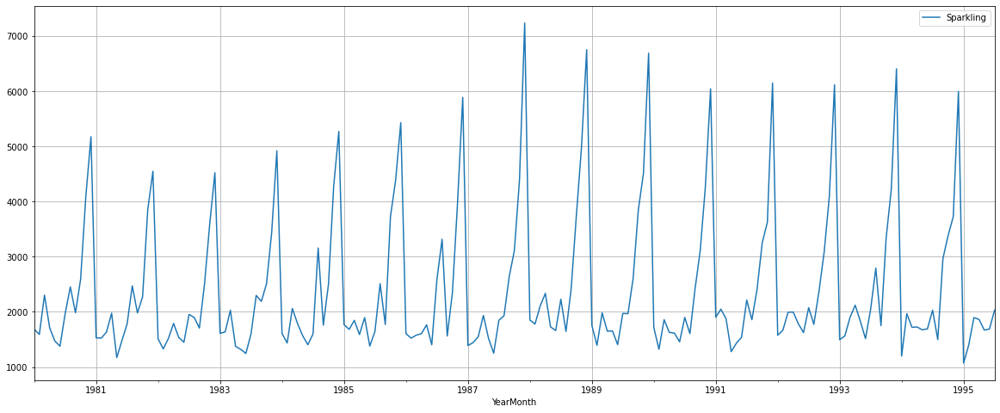

In [8]:
Sparkling.plot()
plt.grid();

# Plot a boxplot to understand the spread of sales across different years and within different months across years.

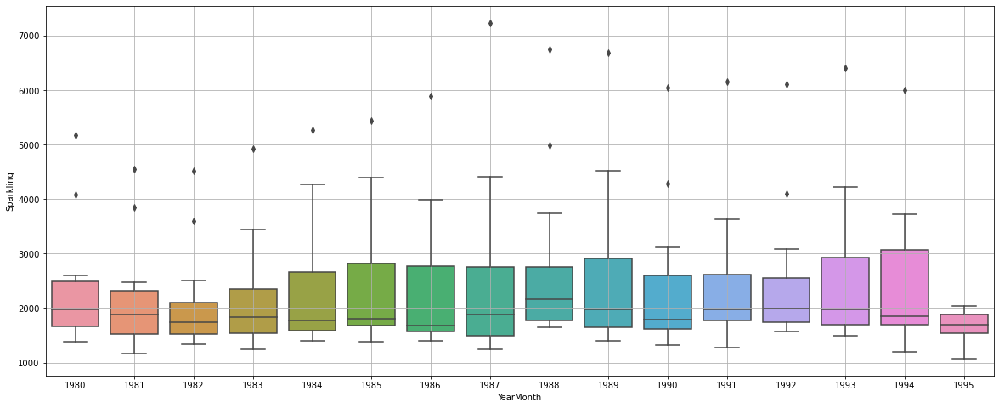

In [14]:
sns.boxplot(x = Sparkling.index.year,y = Sparkling['Sparkling'])
plt.grid();

# MOnthly PLot

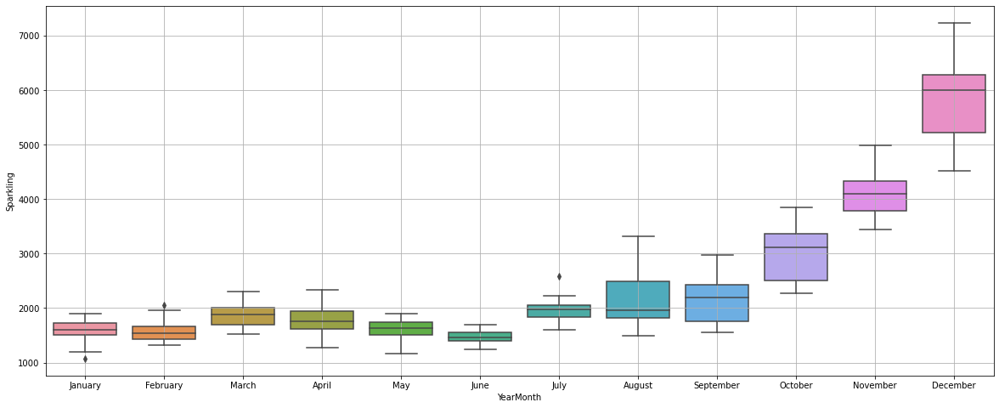

In [15]:
sns.boxplot(x = Sparkling.index.month_name(),y = Sparkling['Sparkling'])
plt.grid();

# The highest such numbers are being recorded towards the end of the years with a huge spike in the month of December.

# monthplot

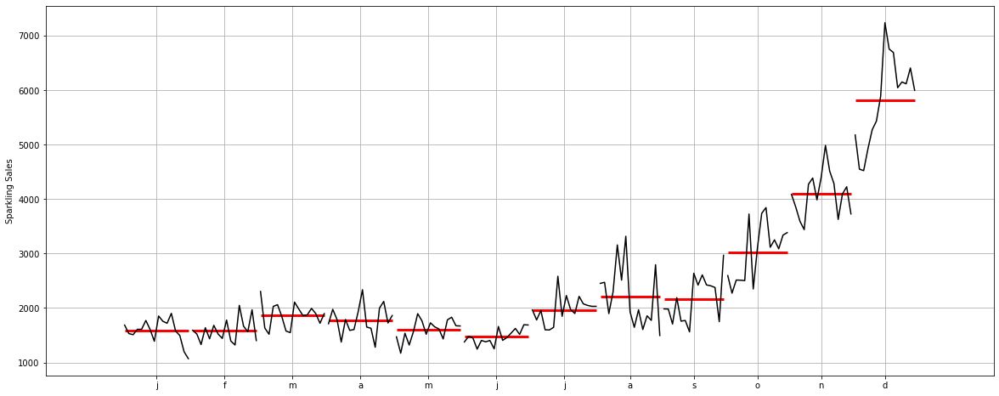

In [16]:
from statsmodels.graphics.tsaplots import month_plot

month_plot(Sparkling['Sparkling'],ylabel='Sparkling Sales')
plt.grid();

# monthly sparkling sales

In [17]:
monthly_sales_across_years = pd.pivot_table(Sparkling, values = 'Sparkling', columns = Sparkling.index.month, index = Sparkling.index.year)
monthly_sales_across_years

YearMonth,1,2,3,4,5,6,7,8,9,10,11,12
YearMonth,,,,,,,,,,,,
1980,1686.0,1591.0,2304.0,1712.0,1471.0,1377.0,1966.0,2453.0,1984.0,2596.0,4087.0,5179.0
1981,1530.0,1523.0,1633.0,1976.0,1170.0,1480.0,1781.0,2472.0,1981.0,2273.0,3857.0,4551.0
1982,1510.0,1329.0,1518.0,1790.0,1537.0,1449.0,1954.0,1897.0,1706.0,2514.0,3593.0,4524.0
1983,1609.0,1638.0,2030.0,1375.0,1320.0,1245.0,1600.0,2298.0,2191.0,2511.0,3440.0,4923.0
1984,1609.0,1435.0,2061.0,1789.0,1567.0,1404.0,1597.0,3159.0,1759.0,2504.0,4273.0,5274.0
1985,1771.0,1682.0,1846.0,1589.0,1896.0,1379.0,1645.0,2512.0,1771.0,3727.0,4388.0,5434.0
1986,1606.0,1523.0,1577.0,1605.0,1765.0,1403.0,2584.0,3318.0,1562.0,2349.0,3987.0,5891.0
1987,1389.0,1442.0,1548.0,1935.0,1518.0,1250.0,1847.0,1930.0,2638.0,3114.0,4405.0,7242.0
1988,1853.0,1779.0,2108.0,2336.0,1728.0,1661.0,2230.0,1645.0,2421.0,3740.0,4988.0,6757.0


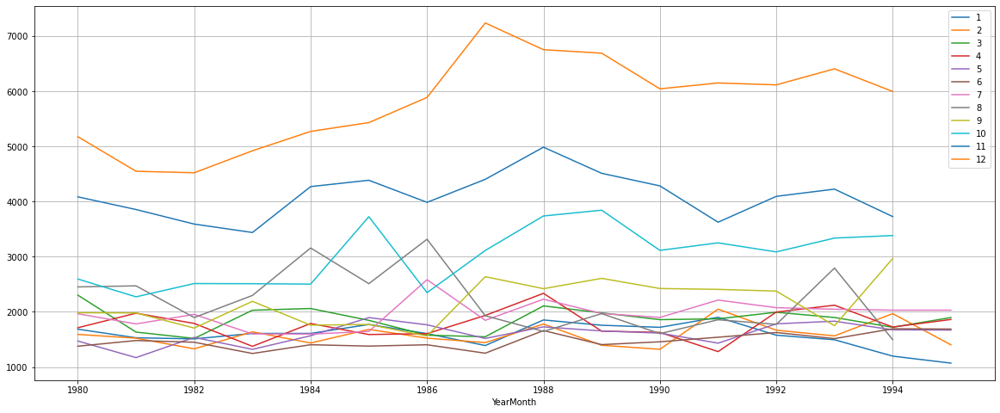

In [18]:
monthly_sales_across_years.plot()
plt.grid()
plt.legend(loc='best');

# Plot the average Sparkling per month and the month on month percentage change of Sparkling.

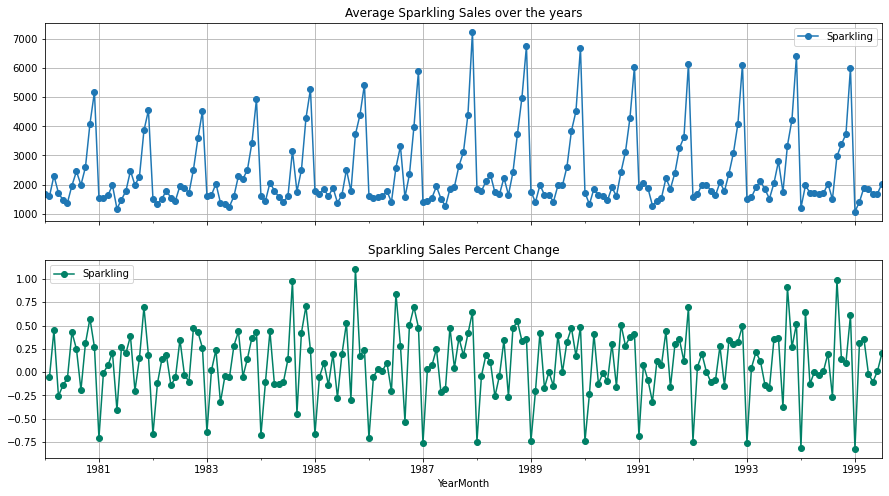

In [19]:
# group by date and get average Sparkling, and precent change
average    = Sparkling.groupby(Sparkling.index)["Sparkling"].mean()
pct_change = Sparkling.groupby(Sparkling.index)["Sparkling"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(15,8))

# plot average Sparkling over time(year-month)
ax1 = average.plot(legend=True,ax=axis1,marker='o',title="Average Sparkling Sales over the years",grid=True)
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())
# plot precent change for Sparkling over time(year-month)
ax2 = pct_change.plot(legend=True,ax=axis2,marker='o',colormap="summer",title="Sparkling Sales Percent Change",grid=True)

The above two graphs tells us the Average 'Sparkling' and the Percentage change of 'Sparkling' with respect to the time.

#Decompose the time series and plot the differenrt components

In [20]:
from statsmodels.tsa.seasonal import seasonal_decompose

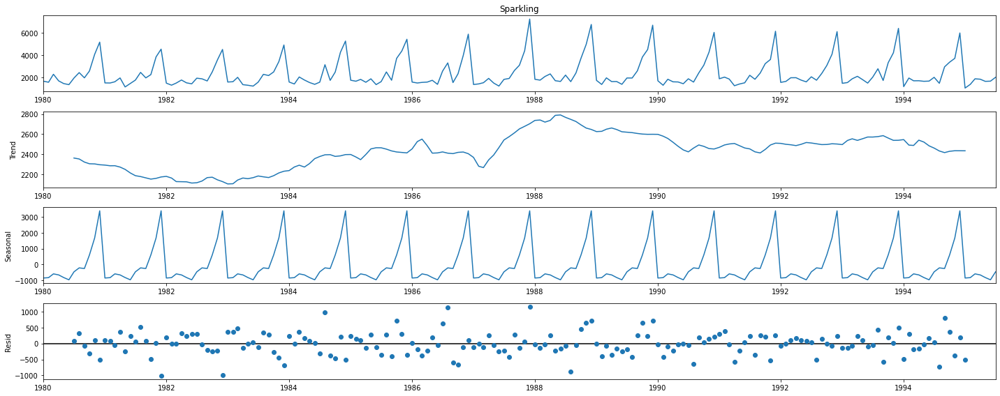

In [21]:
# additive

decomposition = seasonal_decompose(Sparkling['Sparkling'],model='additive')
decomposition.plot();

In [22]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 YearMonth
1980-01-01            NaN
1980-02-01            NaN
1980-03-01            NaN
1980-04-01            NaN
1980-05-01            NaN
1980-06-01            NaN
1980-07-01    2360.666667
1980-08-01    2351.333333
1980-09-01    2320.541667
1980-10-01    2303.583333
1980-11-01    2302.041667
1980-12-01    2293.791667
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    -854.260599
1980-02-01    -830.350678
1980-03-01    -592.356630
1980-04-01    -658.490559
1980-05-01    -824.416154
1980-06-01    -967.434011
1980-07-01    -465.502265
1980-08-01    -214.332821
1980-09-01    -254.677265
1980-10-01     599.769957
1980-11-01    1675.067179
1980-12-01    3386.983846
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01           NaN
1980-02-01           NaN
1980-03-01           NaN
1980-04-01           NaN
1980-05-01           NaN
1980-06-01           NaN
1980-07-01     70.835599
1980-08-01    315.999487
1980-09-01    -81.864401
1980-10-01   -307.353290


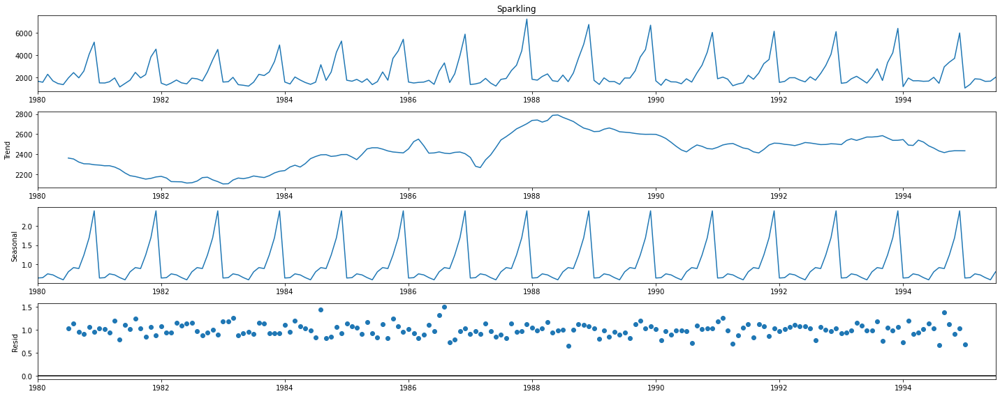

In [23]:
# multiplicative

decomposition = seasonal_decompose(Sparkling['Sparkling'],model='multiplicative')
decomposition.plot();

In [24]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 YearMonth
1980-01-01            NaN
1980-02-01            NaN
1980-03-01            NaN
1980-04-01            NaN
1980-05-01            NaN
1980-06-01            NaN
1980-07-01    2360.666667
1980-08-01    2351.333333
1980-09-01    2320.541667
1980-10-01    2303.583333
1980-11-01    2302.041667
1980-12-01    2293.791667
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    0.649843
1980-02-01    0.659214
1980-03-01    0.757440
1980-04-01    0.730351
1980-05-01    0.660609
1980-06-01    0.603468
1980-07-01    0.809164
1980-08-01    0.918822
1980-09-01    0.894367
1980-10-01    1.241789
1980-11-01    1.690158
1980-12-01    2.384776
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01         NaN
1980-02-01         NaN
1980-03-01         NaN
1980-04-01         NaN
1980-05-01         NaN
1980-06-01         NaN
1980-07-01    1.029230
1980-08-01    1.135407
1980-09-01    0.955954
1980-10-01    0.907513
1980-11-01    1.050423
1980-12-01    0.946770
Name: resi

# Question 3

# Split the data into training and test. The test data should start in 1991.

In [25]:
Sparkling_train=Sparkling[Sparkling.index.year < 1991]
Sparkling_test=Sparkling[Sparkling.index.year >= 1991]

In [26]:
## This is to display multiple data frames from one cell
from IPython.display import display

In [27]:
print('First few rows of Sparkling_training Data')
display(Sparkling_train.head())
print('Last few rows of Sparkling_training Data')
display(Sparkling_train.tail())
print('First few rows of Sparkling_test Data')
display(Sparkling_test.head())
print('Last few rows of Sparkling_test Data')
display(Sparkling_test.tail())

First few rows of Sparkling_training Data


,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


Last few rows of Sparkling_training Data


,Sparkling
YearMonth,
1990-08-01,1605
1990-09-01,2424
1990-10-01,3116
1990-11-01,4286
1990-12-01,6047


First few rows of Sparkling_test Data


,Sparkling
YearMonth,
1991-01-01,1902
1991-02-01,2049
1991-03-01,1874
1991-04-01,1279
1991-05-01,1432


Last few rows of Sparkling_test Data


,Sparkling
YearMonth,
1995-03-01,1897
1995-04-01,1862
1995-05-01,1670
1995-06-01,1688
1995-07-01,2031


In [28]:
print(Sparkling_train.shape)
print(Sparkling_test.shape)

(132, 1)
(55, 1)


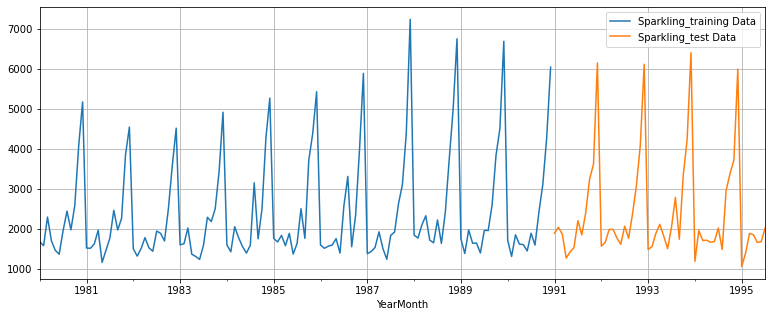

In [30]:
Sparkling_train['Sparkling'].plot(figsize=(13,5))
Sparkling_test['Sparkling'].plot(figsize=(13,5))
plt.grid()
plt.legend(['Sparkling_training Data','Sparkling_test Data'])
plt.show()

# Question 4

# Build all the exponential smoothing models on the training data and evaluate the model using RMSE on the test data. Other models such as regression,naïve forecast models and simple average models. should also be built on the training data and check the performance on the test data using RMSE.

# Model 1

In [31]:
Sparkling_train_time = [i+1 for i in range(len(Sparkling_train))]
Sparkling_test_time = [i+len(Sparkling_train)+1 for i in range(len(Sparkling_test))]
print('Sparkling_training Time instance','\n',Sparkling_train_time)
print('Sparkling_test Time instance','\n',Sparkling_test_time)

Sparkling_training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]
Sparkling_test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [32]:
LinearRegression_Sparkling_train = Sparkling_train.copy()
LinearRegression_Sparkling_test = Sparkling_test.copy()

In [33]:
LinearRegression_Sparkling_train['time'] = Sparkling_train_time
LinearRegression_Sparkling_test['time'] = Sparkling_test_time

print('Sparkling_training Data','\n',LinearRegression_Sparkling_train.head(),'\n')
print('Sparkling_training Data','\n',LinearRegression_Sparkling_train.tail(),'\n')
print('Sparkling_test Data','\n',LinearRegression_Sparkling_test.head(),'\n')
print('Sparkling_test Data','\n',LinearRegression_Sparkling_test.tail(),'\n')

Sparkling_training Data 
             Sparkling  time
YearMonth                  
1980-01-01       1686     1
1980-02-01       1591     2
1980-03-01       2304     3
1980-04-01       1712     4
1980-05-01       1471     5 

Sparkling_training Data 
             Sparkling  time
YearMonth                  
1990-08-01       1605   128
1990-09-01       2424   129
1990-10-01       3116   130
1990-11-01       4286   131
1990-12-01       6047   132 

Sparkling_test Data 
             Sparkling  time
YearMonth                  
1991-01-01       1902   133
1991-02-01       2049   134
1991-03-01       1874   135
1991-04-01       1279   136
1991-05-01       1432   137 

Sparkling_test Data 
             Sparkling  time
YearMonth                  
1995-03-01       1897   183
1995-04-01       1862   184
1995-05-01       1670   185
1995-06-01       1688   186
1995-07-01       2031   187 



In [34]:
from sklearn.linear_model import LinearRegression

In [35]:
lr = LinearRegression()

In [36]:
lr.fit(LinearRegression_Sparkling_train[['time']],LinearRegression_Sparkling_train['Sparkling'].values)

LinearRegression()

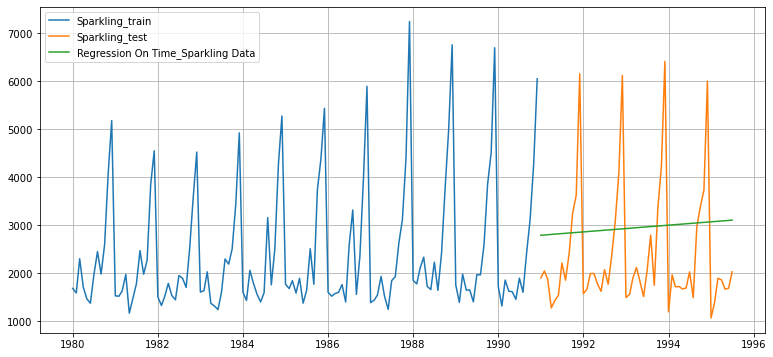

In [179]:
Sparkling_test_predictions_model1 = lr.predict(LinearRegression_Sparkling_test[['time']])
LinearRegression_Sparkling_test['RegOnTime'] = Sparkling_test_predictions_model1

plt.figure(figsize=(13,6))
plt.plot( Sparkling_train['Sparkling'], label='Sparkling_train')
plt.plot(Sparkling_test['Sparkling'], label='Sparkling_test')
plt.plot(LinearRegression_Sparkling_test['RegOnTime'], label='Regression On Time_Sparkling Data')
plt.legend(loc='best')
plt.grid();

In [38]:
from sklearn import metrics

In [39]:
rmse_model1_Sparkling_test = metrics.mean_squared_error(Sparkling_test['Sparkling'],Sparkling_test_predictions_model1,squared=False)
print("For RegressionOnTime forecast on the Sparkling_test Data,  RMSE is %3.3f" %(rmse_model1_Sparkling_test))

For RegressionOnTime forecast on the Sparkling_test Data,  RMSE is 1389.135


In [40]:
results_SparklingDf = pd.DataFrame({'Sparkling_test RMSE': [rmse_model1_Sparkling_test]},index=['RegressionOnTime'])
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175


# Model 2 - Naive Bayes

In [41]:
NaiveModel_Sparkling_train = Sparkling_train.copy()
NaiveModel_Sparkling_test = Sparkling_test.copy()

In [42]:
NaiveModel_Sparkling_test.head()

,Sparkling
YearMonth,
1991-01-01,1902
1991-02-01,2049
1991-03-01,1874
1991-04-01,1279
1991-05-01,1432


In [43]:
NaiveModel_Sparkling_test['naive'] = np.asarray(Sparkling_train['Sparkling'])[len(np.asarray(Sparkling_train['Sparkling']))-1]
NaiveModel_Sparkling_test['naive'].head()

YearMonth
1991-01-01    6047
1991-02-01    6047
1991-03-01    6047
1991-04-01    6047
1991-05-01    6047
Name: naive, dtype: int64

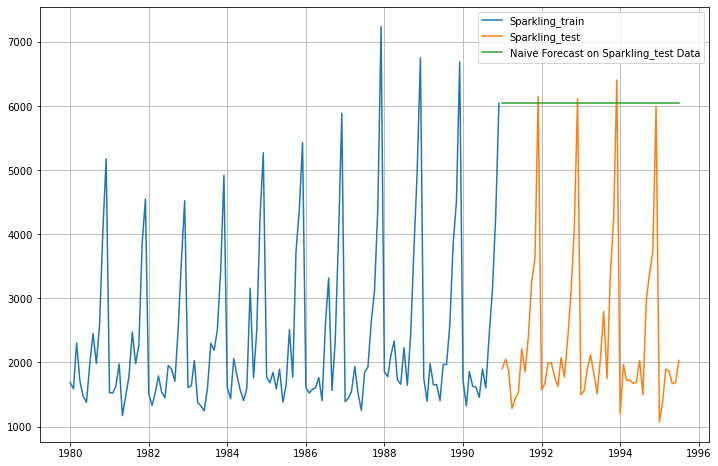

In [45]:
plt.figure(figsize=(12,8))
plt.plot(NaiveModel_Sparkling_train['Sparkling'], label='Sparkling_train')
plt.plot(Sparkling_test['Sparkling'], label='Sparkling_test')
plt.plot(NaiveModel_Sparkling_test['naive'], label='Naive Forecast on Sparkling_test Data')
plt.legend(loc='best')
plt.grid();

In [46]:
rmse_model2_Sparkling_test = metrics.mean_squared_error(Sparkling_test['Sparkling'],NaiveModel_Sparkling_test['naive'],squared=False)
print("For Naive Based forecast on the Sparkling_test Data,  RMSE is %3.3f" %(rmse_model2_Sparkling_test))

For Naive Based forecast on the Sparkling_test Data,  RMSE is 3864.279


In [47]:
results_SparklingDf_2 = pd.DataFrame({'Sparkling_test RMSE': [rmse_model2_Sparkling_test]},index=['NaiveModel'])

results_SparklingDf = pd.concat([results_SparklingDf, results_SparklingDf_2])
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352


# Model 3: Simple Average

In [48]:
SimpleAverage_Sparkling_train = Sparkling_train.copy()
SimpleAverage_Sparkling_test = Sparkling_test.copy()

In [49]:
SimpleAverage_Sparkling_test['mean_forecast'] = Sparkling_train['Sparkling'].mean()
SimpleAverage_Sparkling_test.head()

,Sparkling,mean_forecast
YearMonth,,
1991-01-01,1902,2403.780303
1991-02-01,2049,2403.780303
1991-03-01,1874,2403.780303
1991-04-01,1279,2403.780303
1991-05-01,1432,2403.780303


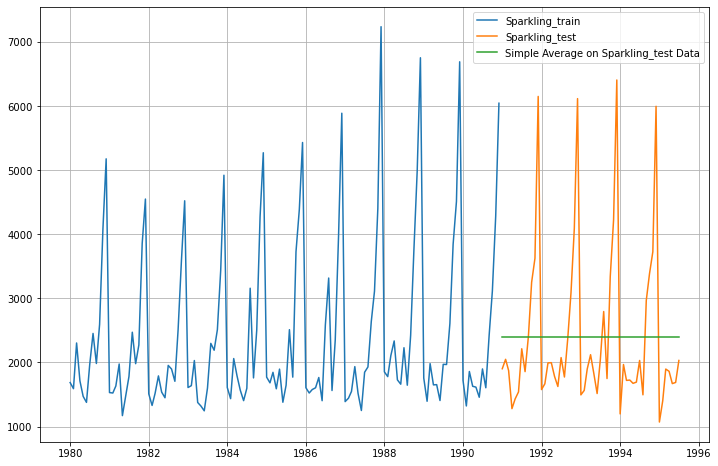

In [50]:
plt.figure(figsize=(12,8))
plt.plot(SimpleAverage_Sparkling_train['Sparkling'], label='Sparkling_train')
plt.plot(SimpleAverage_Sparkling_test['Sparkling'], label='Sparkling_test')
plt.plot(SimpleAverage_Sparkling_test['mean_forecast'], label='Simple Average on Sparkling_test Data')
plt.legend(loc='best')
plt.grid();

In [51]:
rmse_model3_Sparkling_test = metrics.mean_squared_error(Sparkling_test['Sparkling'],SimpleAverage_Sparkling_test['mean_forecast'],squared=False)
print("For Simple Average forecast on the Sparkling_test Data,  RMSE is %3.3f" %(rmse_model3_Sparkling_test))

For Simple Average forecast on the Sparkling_test Data,  RMSE is 1275.082


In [52]:
results_SparklingDf_3 = pd.DataFrame({'Sparkling_test RMSE': [rmse_model3_Sparkling_test]},index=['SimpleAverageModel'])

results_SparklingDf = pd.concat([results_SparklingDf, results_SparklingDf_3])
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804


# Model 4 : Moving Average

In [53]:
MovingAverage_Sparkling = Sparkling.copy()
MovingAverage_Sparkling.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


In [54]:
MovingAverage_Sparkling['Trailing_2'] = MovingAverage_Sparkling['Sparkling'].rolling(2).mean()
MovingAverage_Sparkling['Trailing_4'] = MovingAverage_Sparkling['Sparkling'].rolling(4).mean()
MovingAverage_Sparkling['Trailing_6'] = MovingAverage_Sparkling['Sparkling'].rolling(6).mean()
MovingAverage_Sparkling['Trailing_9'] = MovingAverage_Sparkling['Sparkling'].rolling(9).mean()

MovingAverage_Sparkling.head(10)

,Sparkling,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,1686,NaN,NaN,NaN,NaN
1980-02-01,1591,1638.5,NaN,NaN,NaN
1980-03-01,2304,1947.5,NaN,NaN,NaN
1980-04-01,1712,2008.0,1823.25,NaN,NaN
1980-05-01,1471,1591.5,1769.50,NaN,NaN
1980-06-01,1377,1424.0,1716.00,1690.166667,NaN
1980-07-01,1966,1671.5,1631.50,1736.833333,NaN
1980-08-01,2453,2209.5,1816.75,1880.500000,NaN
1980-09-01,1984,2218.5,1945.00,1827.166667,1838.222222


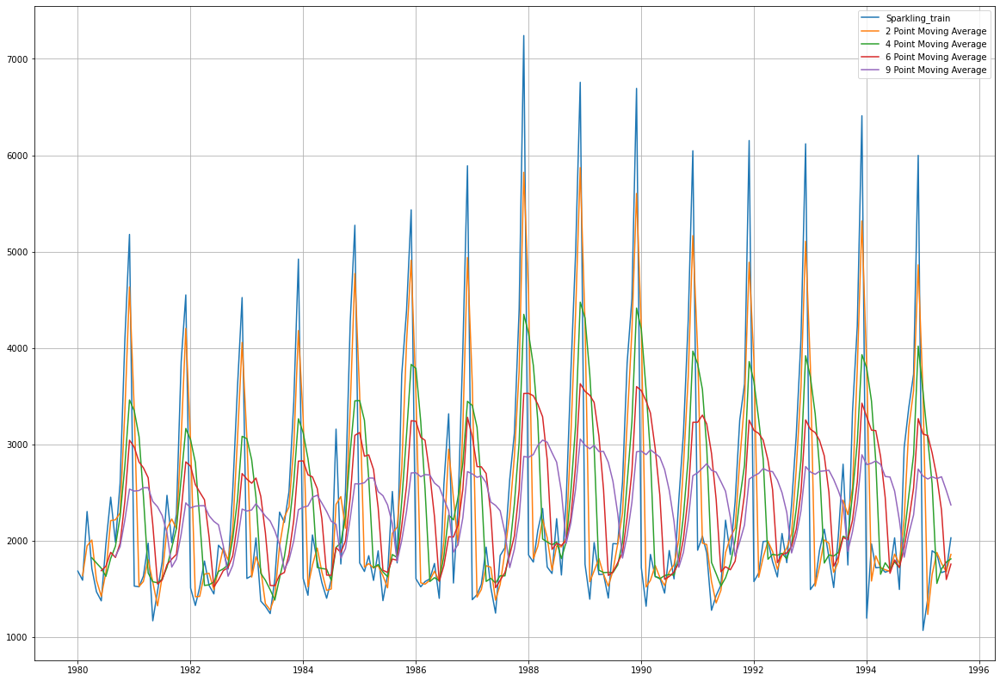

In [55]:
plt.figure(figsize=(20,14))
plt.plot(MovingAverage_Sparkling['Sparkling'], label='Sparkling_train')
plt.plot(MovingAverage_Sparkling['Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage_Sparkling['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage_Sparkling['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage_Sparkling['Trailing_9'],label = '9 Point Moving Average')

plt.legend(loc = 'best')
plt.grid();

In [56]:
MovingAverage_Sparkling_train = Sparkling_train.copy()
MovingAverage_Sparkling_train.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


In [57]:
MovingAverage_Sparkling_train['Trailing_2'] = MovingAverage_Sparkling_train['Sparkling'].rolling(2).mean()
MovingAverage_Sparkling_train['Trailing_4'] = MovingAverage_Sparkling_train['Sparkling'].rolling(4).mean()
MovingAverage_Sparkling_train['Trailing_6'] = MovingAverage_Sparkling_train['Sparkling'].rolling(6).mean()
MovingAverage_Sparkling_train['Trailing_9'] = MovingAverage_Sparkling_train['Sparkling'].rolling(9).mean()

MovingAverage_Sparkling_train.head(10)

,Sparkling,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,1686,NaN,NaN,NaN,NaN
1980-02-01,1591,1638.5,NaN,NaN,NaN
1980-03-01,2304,1947.5,NaN,NaN,NaN
1980-04-01,1712,2008.0,1823.25,NaN,NaN
1980-05-01,1471,1591.5,1769.50,NaN,NaN
1980-06-01,1377,1424.0,1716.00,1690.166667,NaN
1980-07-01,1966,1671.5,1631.50,1736.833333,NaN
1980-08-01,2453,2209.5,1816.75,1880.500000,NaN
1980-09-01,1984,2218.5,1945.00,1827.166667,1838.222222


In [58]:
MovingAverage_Sparkling_train.tail(3)

,Sparkling,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1990-10-01,3116,2770.0,2261.00,2019.333333,1880.444444
1990-11-01,4286,3701.0,2857.75,2464.500000,2209.888889
1990-12-01,6047,5166.5,3968.25,3229.500000,2675.222222


In [59]:
MovingAverage_Sparkling_test = Sparkling_test.copy()

In [60]:
MovingAverage_Sparkling_train.shape[0]


132

In [61]:
x=MovingAverage_Sparkling_train.iloc[MovingAverage_Sparkling_train.shape[0]-1,:]
x

Sparkling     6047.000000
Trailing_2    5166.500000
Trailing_4    3968.250000
Trailing_6    3229.500000
Trailing_9    2675.222222
Name: 1990-12-01 00:00:00, dtype: float64

In [62]:
MovingAverage_Sparkling_test['Trailing_2'] = np.asarray(MovingAverage_Sparkling_train['Trailing_2'])[len(np.asarray(MovingAverage_Sparkling_train['Trailing_2']))-1]
MovingAverage_Sparkling_test['Trailing_4']= np.asarray(MovingAverage_Sparkling_train['Trailing_4'])[len(np.asarray(MovingAverage_Sparkling_train['Trailing_4']))-1]
MovingAverage_Sparkling_test['Trailing_6'] = np.asarray(MovingAverage_Sparkling_train['Trailing_6'])[len(np.asarray(MovingAverage_Sparkling_train['Trailing_6']))-1]
MovingAverage_Sparkling_test['Trailing_9'] = np.asarray(MovingAverage_Sparkling_train['Trailing_9'])[len(np.asarray(MovingAverage_Sparkling_train['Trailing_9']))-1]
MovingAverage_Sparkling_test.head()

,Sparkling,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1991-01-01,1902,5166.5,3968.25,3229.5,2675.222222
1991-02-01,2049,5166.5,3968.25,3229.5,2675.222222
1991-03-01,1874,5166.5,3968.25,3229.5,2675.222222
1991-04-01,1279,5166.5,3968.25,3229.5,2675.222222
1991-05-01,1432,5166.5,3968.25,3229.5,2675.222222


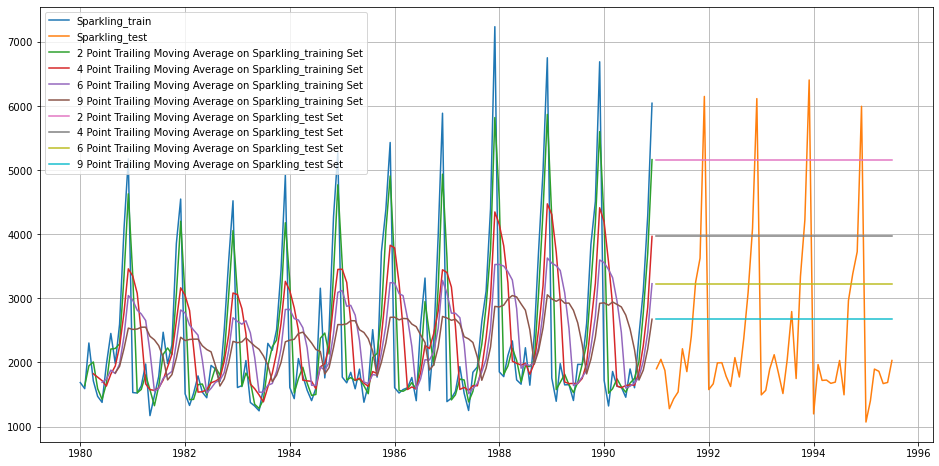

In [63]:
plt.figure(figsize=(16,8))
plt.plot(MovingAverage_Sparkling_train['Sparkling'], label='Sparkling_train')
plt.plot(MovingAverage_Sparkling_test['Sparkling'], label='Sparkling_test')

plt.plot(MovingAverage_Sparkling_train['Trailing_2'], label='2 Point Trailing Moving Average on Sparkling_training Set')
plt.plot(MovingAverage_Sparkling_train['Trailing_4'], label='4 Point Trailing Moving Average on Sparkling_training Set')
plt.plot(MovingAverage_Sparkling_train['Trailing_6'],label = '6 Point Trailing Moving Average on Sparkling_training Set')
plt.plot(MovingAverage_Sparkling_train['Trailing_9'],label = '9 Point Trailing Moving Average on Sparkling_training Set')

plt.plot(MovingAverage_Sparkling_test['Trailing_2'], label='2 Point Trailing Moving Average on Sparkling_test Set')
plt.plot(MovingAverage_Sparkling_test['Trailing_4'], label='4 Point Trailing Moving Average on Sparkling_test Set')
plt.plot(MovingAverage_Sparkling_test['Trailing_6'],label = '6 Point Trailing Moving Average on Sparkling_test Set')
plt.plot(MovingAverage_Sparkling_test['Trailing_9'],label = '9 Point Trailing Moving Average on Sparkling_test Set')
plt.legend(loc = 'best')
plt.grid();

In [64]:
## Sparkling_test Data - RMSE --> 2 point Trailing MA

rmse_model4_Sparkling_test_2 = metrics.mean_squared_error(Sparkling_test['Sparkling'],MovingAverage_Sparkling_test['Trailing_2'],squared=False)
print("For 2 point Moving Average Model forecast on the Sparkling_training Data,  RMSE is %3.3f" %(rmse_model4_Sparkling_test_2))

## Sparkling_test Data - RMSE  --> 4 point Trailing MA

rmse_model4_Sparkling_test_4 = metrics.mean_squared_error(Sparkling_test['Sparkling'],MovingAverage_Sparkling_test['Trailing_4'],squared=False)
print("For 4 point Moving Average Model forecast on the Sparkling_test Data,  RMSE is %3.3f" %(rmse_model4_Sparkling_test_4))

## Sparkling_test Data - RMSE --> 6 point Trailing MA

rmse_model4_Sparkling_test_6 = metrics.mean_squared_error(Sparkling_test['Sparkling'],MovingAverage_Sparkling_test['Trailing_6'],squared=False)
print("For 6 point Moving Average Model forecast on the Sparkling_test Data,  RMSE is %3.3f" %(rmse_model4_Sparkling_test_6))

## Sparkling_test Data - RMSE  --> 9 point Trailing MA

rmse_model4_Sparkling_test_9 = metrics.mean_squared_error(Sparkling_test['Sparkling'],MovingAverage_Sparkling_test['Trailing_9'],squared=False)
print("For 9 point Moving Average Model forecast on the Sparkling_test Data,  RMSE is %3.3f " %(rmse_model4_Sparkling_test_9))

For 2 point Moving Average Model forecast on the Sparkling_training Data,  RMSE is 3046.976
For 4 point Moving Average Model forecast on the Sparkling_test Data,  RMSE is 2021.856
For 6 point Moving Average Model forecast on the Sparkling_test Data,  RMSE is 1521.611
For 9 point Moving Average Model forecast on the Sparkling_test Data,  RMSE is 1304.619 


In [65]:
results_SparklingDf_4 = pd.DataFrame({'Sparkling_test RMSE': [rmse_model4_Sparkling_test_2,rmse_model4_Sparkling_test_4
                                          ,rmse_model4_Sparkling_test_6,rmse_model4_Sparkling_test_9]}
                           ,index=['2point_MovingAverage_Sparkling','4point_MovingAverage_Sparkling'
                                   ,'6point_MovingAverage_Sparkling','9point_MovingAverage_Sparkling'])

results_SparklingDf = pd.concat([results_SparklingDf, results_SparklingDf_4])
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912


# plot all the models and compare the Time Series plots.

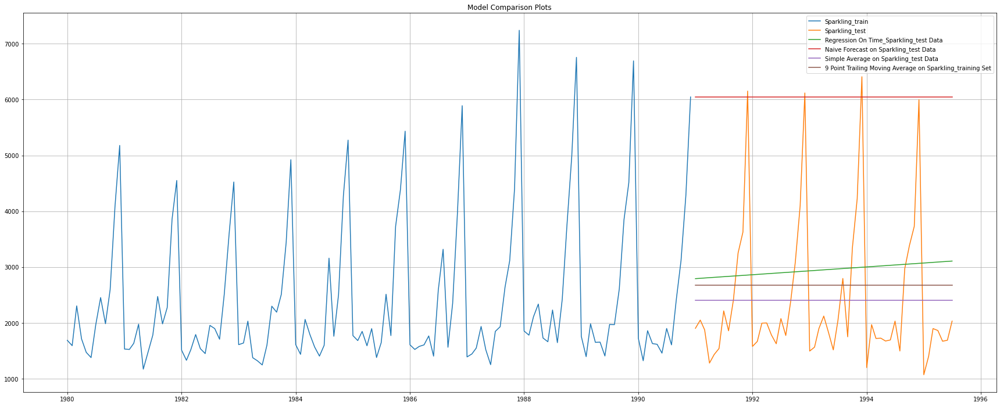

In [66]:
## Plotting on both Sparkling_training and Sparkling_test data

plt.figure(figsize=(30,12))
plt.plot(Sparkling_train['Sparkling'], label='Sparkling_train')
plt.plot(Sparkling_test['Sparkling'], label='Sparkling_test')

plt.plot(LinearRegression_Sparkling_test['RegOnTime'], label='Regression On Time_Sparkling_test Data')

plt.plot(NaiveModel_Sparkling_test['naive'], label='Naive Forecast on Sparkling_test Data')

plt.plot(SimpleAverage_Sparkling_test['mean_forecast'], label='Simple Average on Sparkling_test Data')

plt.plot(MovingAverage_Sparkling_test['Trailing_9'], label='9 Point Trailing Moving Average on Sparkling_training Set')


plt.legend(loc='best')
plt.title("Model Comparison Plots")
plt.grid();

# Model 5: Simple exponential Smoothing

In [67]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [68]:
SES_Sparkling_train = Sparkling_train.copy()
SES_Sparkling_test = Sparkling_test.copy()

In [69]:
model_SES_Sparkling = SimpleExpSmoothing(SES_Sparkling_train['Sparkling'])

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [70]:
model_SES_Sparkling_autofit = model_SES_Sparkling.fit(optimized=True)

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [71]:
model_SES_Sparkling_autofit.params

{'smoothing_level': 0.049607360581862936,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1818.535750008871,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [72]:
SES_Sparkling_test['predict'] = model_SES_Sparkling_autofit.forecast(steps=len(Sparkling_test))
SES_Sparkling_test.head()

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


,Sparkling,predict
YearMonth,,
1991-01-01,1902,2724.932624
1991-02-01,2049,2724.932624
1991-03-01,1874,2724.932624
1991-04-01,1279,2724.932624
1991-05-01,1432,2724.932624


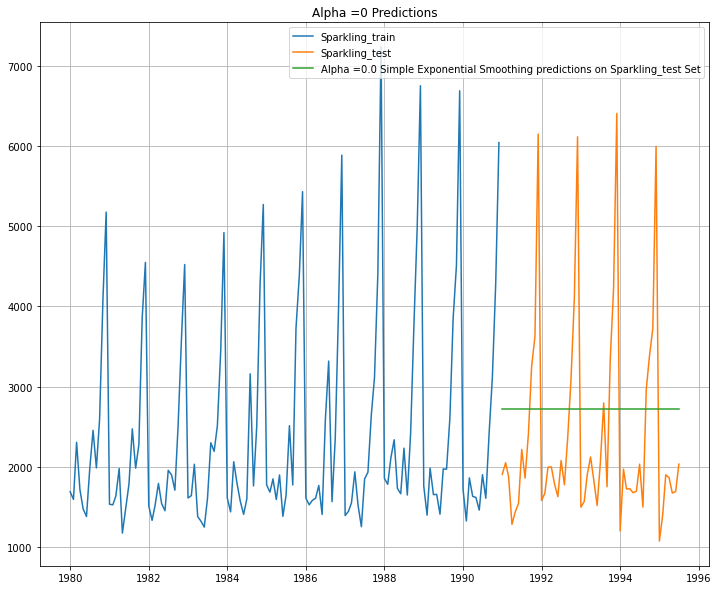

In [73]:
plt.figure(figsize=(12,10))
plt.plot(SES_Sparkling_train['Sparkling'], label='Sparkling_train')
plt.plot(SES_Sparkling_test['Sparkling'], label='Sparkling_test')

plt.plot(SES_Sparkling_test['predict'], label='Alpha =0.0 Simple Exponential Smoothing predictions on Sparkling_test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Alpha =0 Predictions');

# model evaluation for alpha=0.05 simple exponential smoothing

In [74]:
rmse_model5_Sparkling_test_1 = metrics.mean_squared_error(SES_Sparkling_test['Sparkling'],SES_Sparkling_test['predict'],squared=False)
print("For Alpha =0.0005 Simple Exponential Smoothing Model forecast on the Sparkling_test Data, RMSE is %3.3f" %(rmse_model5_Sparkling_test_1))


For Alpha =0.0005 Simple Exponential Smoothing Model forecast on the Sparkling_test Data, RMSE is 1316.035


In [75]:
results_SparklingDf_5 = pd.DataFrame({'Sparkling_test RMSE': [rmse_model5_Sparkling_test_1]},index=['Alpha=0.005,SimpleExponentialSmoothing'])

results_SparklingDf = pd.concat([results_SparklingDf, results_SparklingDf_5])
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487


# setting different values of alpha

In [76]:
## First we will define an empty dataframe to store our values from the loop

results_SparklingDf_6 = pd.DataFrame({'Alpha Values':[],'Sparkling_train RMSE':[],'Sparkling_test RMSE': []})
results_SparklingDf_6

,Alpha Values,Sparkling_train RMSE,Sparkling_test RMSE


In [77]:
for i in np.arange(0,1,0.05):
    model_SES_Sparkling_alpha_i = model_SES_Sparkling.fit(smoothing_level=i,optimized=False,use_brute=True)
    SES_Sparkling_train['predict',i] = model_SES_Sparkling_alpha_i.fittedvalues
    SES_Sparkling_test['predict',i] = model_SES_Sparkling_alpha_i.forecast(steps=len(Sparkling_test))
    
    rmse_model5_Sparkling_train_i = metrics.mean_squared_error(SES_Sparkling_train['Sparkling'],SES_Sparkling_train['predict',i],squared=False)
    
    rmse_model5_Sparkling_test_i = metrics.mean_squared_error(SES_Sparkling_test['Sparkling'],SES_Sparkling_test['predict',i],squared=False)
    
    results_SparklingDf_6 = results_SparklingDf_6.append({'Alpha Values':i,'Sparkling_train RMSE':rmse_model5_Sparkling_train_i 
                                      ,'Sparkling_test RMSE':rmse_model5_Sparkling_test_i}, ignore_index=True)

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\t

In [78]:
results_SparklingDf_6.sort_values(by=['Sparkling_test RMSE'],ascending=True)

,Alpha Values,Sparkling_train RMSE,Sparkling_test RMSE
1,0.05,1318.429335,1316.411742
2,0.10,1333.873836,1375.393398
0,0.00,1483.667178,1460.954675
3,0.15,1347.521016,1466.203651
4,0.20,1356.042987,1595.206839
5,0.25,1359.701408,1755.488175
6,0.30,1359.511747,1935.507132
7,0.35,1356.733677,2123.914871
8,0.40,1352.588879,2311.919615
9,0.45,1348.095362,2493.786514


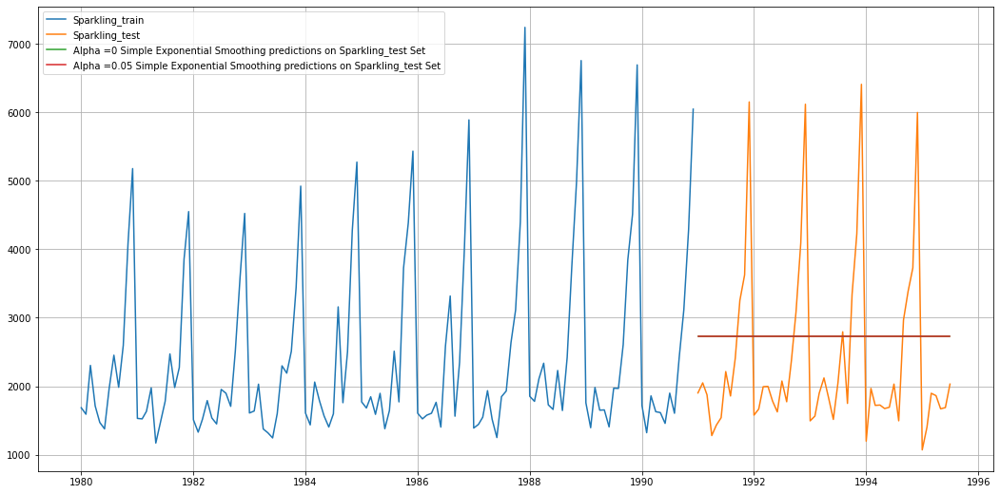

In [79]:
## Plotting on both the Sparkling_training and Sparkling_test data

plt.figure(figsize=(18,9))
plt.plot(SES_Sparkling_train['Sparkling'], label='Sparkling_train')
plt.plot(SES_Sparkling_test['Sparkling'], label='Sparkling_test')

plt.plot(SES_Sparkling_test['predict'], label='Alpha =0 Simple Exponential Smoothing predictions on Sparkling_test Set')

plt.plot(SES_Sparkling_test['predict', 0.05], label='Alpha =0.05 Simple Exponential Smoothing predictions on Sparkling_test Set')



plt.legend(loc='best')
plt.grid();

In [80]:
results_SparklingDf_6_1 = pd.DataFrame({'Sparkling_test RMSE': [results_SparklingDf_6.sort_values(by=['Sparkling_test RMSE'],ascending=True).values[0][2]]}
                           ,index=['Alpha=0.05,SimpleExponentialSmoothing'])

results_SparklingDf = pd.concat([results_SparklingDf, results_SparklingDf_6_1])
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487
"Alpha=0.05,SimpleExponentialSmoothing",1316.411742


# Model 6: Double exponential smoothing

In [81]:
DES_Sparkling_train = Sparkling_train.copy()
DES_Sparkling_test = Sparkling_test.copy()

In [82]:
model_DES_Sparkling = Holt(DES_Sparkling_train['Sparkling'])

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [83]:
model_DES_Sparkling_autofit = model_DES_Sparkling.fit(optimized=True)

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [84]:
model_DES_Sparkling_autofit.params

{'smoothing_level': 0.6885714285714285,
 'smoothing_trend': 9.999999999999999e-05,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': -95.0,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [85]:
DES_Sparkling_test['predict'] = model_DES_Sparkling_autofit.forecast(steps=len(Sparkling_test))
DES_Sparkling_test.head()

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


,Sparkling,predict
YearMonth,,
1991-01-01,1902,5221.278699
1991-02-01,2049,5127.886554
1991-03-01,1874,5034.494409
1991-04-01,1279,4941.102264
1991-05-01,1432,4847.710119


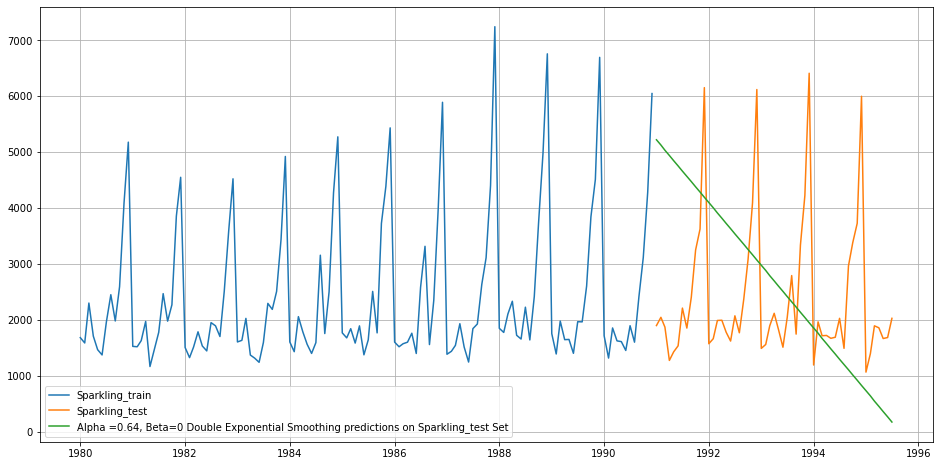

In [86]:
## Plotting on both the Sparkling_training and Sparkling_test data

plt.figure(figsize=(16,8))
plt.plot(DES_Sparkling_train['Sparkling'], label='Sparkling_train')
plt.plot(DES_Sparkling_test['Sparkling'], label='Sparkling_test')

plt.plot(DES_Sparkling_test['predict'], label='Alpha =0.64, Beta=0 Double Exponential Smoothing predictions on Sparkling_test Set')

plt.legend(loc='best')
plt.grid()

# model evaluation for alpha=0.64 and beta=0.005 Double exponential smoothing

In [87]:
rmse_model7_Sparkling_test_1 = metrics.mean_squared_error(DES_Sparkling_test['Sparkling'],DES_Sparkling_test['predict'],squared=False)
print("For Alpha =0.64, Beta=0 Double Exponential Smoothing Model forecast on the Sparkling_test Data, RMSE is %3.3f" %(rmse_model7_Sparkling_test_1))


For Alpha =0.64, Beta=0 Double Exponential Smoothing Model forecast on the Sparkling_test Data, RMSE is 2007.239


In [88]:
results_SparklingDf_7 = pd.DataFrame({'Sparkling_test RMSE': [rmse_model7_Sparkling_test_1]},index=['Alpha =0.64,Beta=0,DoubleExponentialSmoothing'])

results_SparklingDf = pd.concat([results_SparklingDf, results_SparklingDf_7])
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487
"Alpha=0.05,SimpleExponentialSmoothing",1316.411742
"Alpha =0.64,Beta=0,DoubleExponentialSmoothing",2007.238526


In [89]:
## First we will define an empty dataframe to store our values from the loop

results_SparklingDf_7_1 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Sparkling_train RMSE':[],'Sparkling_test RMSE': []})
results_SparklingDf_7_1

,Alpha Values,Beta Values,Sparkling_train RMSE,Sparkling_test RMSE


In [90]:
for i in np.arange(0.05,1.05,0.05):
    for j in np.arange(0.05,1.05,0.05):
        model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
        DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
        DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
        
        rmse_model6_Sparkling_train = metrics.mean_squared_error(DES_Sparkling_train['Sparkling'],DES_Sparkling_train['predict',i,j],squared=False)
        
        rmse_model6_Sparkling_test = metrics.mean_squared_error(DES_Sparkling_test['Sparkling'],DES_Sparkling_test['predict',i,j],squared=False)
        
        results_SparklingDf_7_1 = results_SparklingDf_7_1.append({'Alpha Values':i,'Beta Values':j,'Sparkling_train RMSE':rmse_model6_Sparkling_train
                                          ,'Sparkling_test RMSE':rmse_model6_Sparkling_test}, ignore_index=True)

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Times

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Times

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Times

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Times

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Times

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipyk

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_test['predict',i,j] = model_DES_Sparkling_alpha_i_j.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()

C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Sparkling_alpha_i_j = model_DES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Sparkling_train['predict',i,j] = model_DES_Sparkling_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/3883080100.

In [91]:
results_SparklingDf_7_1.sort_values(by=['Sparkling_test RMSE']).head()

,Alpha Values,Beta Values,Sparkling_train RMSE,Sparkling_test RMSE
0,0.05,0.05,1430.025526,1418.407668
3,0.05,0.20,1382.766405,1443.099273
2,0.05,0.15,1379.162520,1457.041594
1,0.05,0.10,1385.420826,1466.899629
6,0.05,0.35,1414.226231,1547.022626


# Alpha = 0.05 and Beta = 0.05 have the lowest AIC

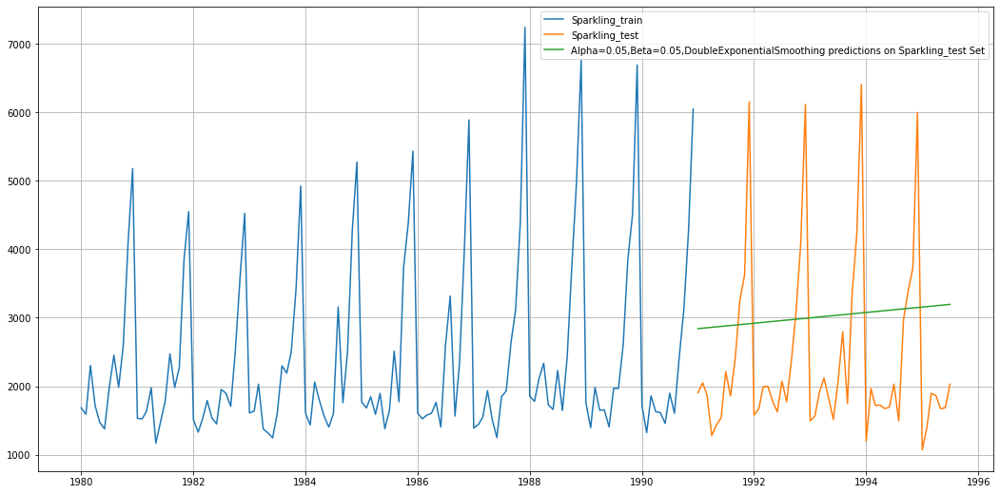

In [92]:
plt.figure(figsize=(18,9))
plt.plot(DES_Sparkling_train['Sparkling'], label='Sparkling_train')
plt.plot(DES_Sparkling_test['Sparkling'], label='Sparkling_test')

plt.plot(DES_Sparkling_test['predict', 0.05, 0.05], label='Alpha=0.05,Beta=0.05,DoubleExponentialSmoothing predictions on Sparkling_test Set')


plt.legend(loc='best')
plt.grid();

In [93]:
results_SparklingDf_7_1 = pd.DataFrame({'Sparkling_test RMSE': [results_SparklingDf_7_1.sort_values(by=['Sparkling_test RMSE']).values[0][3]]}
                           ,index=['Alpha=0.05,Beta=0.05,DoubleExponentialSmoothing'])

results_SparklingDf = pd.concat([results_SparklingDf, results_SparklingDf_7_1])
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487
"Alpha=0.05,SimpleExponentialSmoothing",1316.411742
"Alpha =0.64,Beta=0,DoubleExponentialSmoothing",2007.238526


# model 7: triple exponential smoothing

In [94]:
TES_Sparkling_train = Sparkling_train.copy()
TES_Sparkling_test = Sparkling_test.copy()

In [95]:
model_TES_Sparkling = ExponentialSmoothing(TES_Sparkling_train['Sparkling'],trend='additive',seasonal='additive')

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [96]:
model_TES_Sparkling_autofit = model_TES_Sparkling.fit()

In [98]:
model_TES_Sparkling_autofit.params

{'smoothing_level': 0.11235974440805609,
 'smoothing_trend': 0.03742154913668688,
 'smoothing_seasonal': 0.4932616459048464,
 'damping_trend': nan,
 'initial_level': 1640.2806120050896,
 'initial_trend': -3.261533670070838,
 'initial_seasons': array([  45.86595538,  -48.96808341,  662.32406973,   73.10075169,
        -168.81341007, -262.13208801,  326.10174942,  813.36401315,
         344.51476989,  956.12012048, 2446.68553948, 3538.12189099]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [100]:
TES_Sparkling_test['auto_predict'] = model_TES_Sparkling_autofit.forecast(steps=len(Sparkling_test))
TES_Sparkling_test.head()

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


,Sparkling,auto_predict
YearMonth,,
1991-01-01,1902,1474.966680
1991-02-01,2049,1169.991432
1991-03-01,1874,1658.920133
1991-04-01,1279,1504.953983
1991-05-01,1432,1417.648032


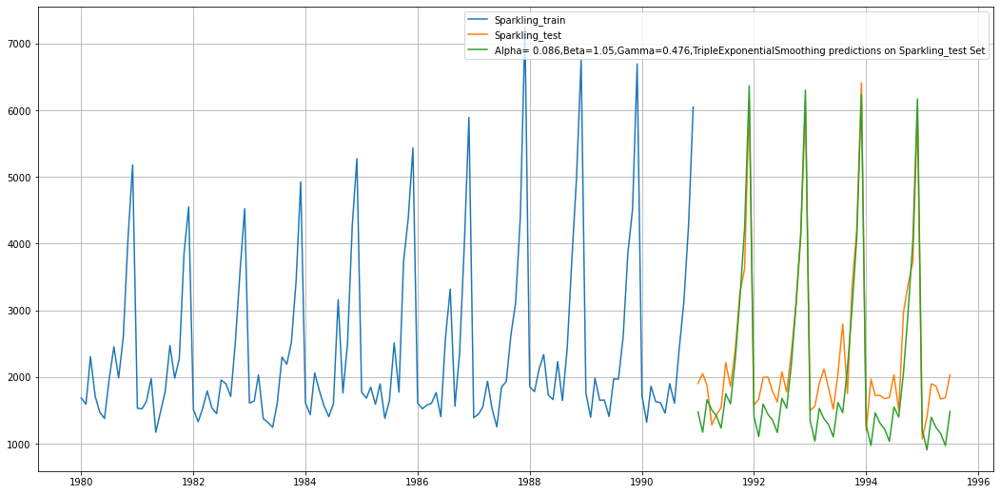

In [101]:
plt.figure(figsize=(18,9))
plt.plot(TES_Sparkling_train['Sparkling'], label='Sparkling_train')
plt.plot(TES_Sparkling_test['Sparkling'], label='Sparkling_test')

plt.plot(TES_Sparkling_test['auto_predict'], label='Alpha= 0.086,Beta=1.05,Gamma=0.476,TripleExponentialSmoothing predictions on Sparkling_test Set')


plt.legend(loc='best')
plt.grid();

In [102]:
rmse_model6_Sparkling_test_1 = metrics.mean_squared_error(TES_Sparkling_test['Sparkling'],TES_Sparkling_test['auto_predict'],squared=False)
print("For Alpha= 0.086,Beta=1.05,Gamma=0.476, Triple Exponential Smoothing Model forecast on the Sparkling_test Data,  RMSE is %3.3f" %(rmse_model6_Sparkling_test_1))

For Alpha= 0.086,Beta=1.05,Gamma=0.476, Triple Exponential Smoothing Model forecast on the Sparkling_test Data,  RMSE is 473.152


In [103]:
results_SparklingDf_8_1 = pd.DataFrame({'Sparkling_test RMSE': [rmse_model6_Sparkling_test_1]}
                           ,index=['Alpha= 0.086,Beta=1.05,Gamma=0.476,TripleExponentialSmoothing'])

results_SparklingDf = pd.concat([results_SparklingDf, results_SparklingDf_8_1])
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487
"Alpha=0.05,SimpleExponentialSmoothing",1316.411742
"Alpha =0.64,Beta=0,DoubleExponentialSmoothing",2007.238526


In [104]:
results_SparklingDf_8_2 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Sparkling_train RMSE':[],'Sparkling_test RMSE': []})
results_SparklingDf_8_2

,Alpha Values,Beta Values,Gamma Values,Sparkling_train RMSE,Sparkling_test RMSE


In [105]:
for i in np.arange(0.05,1.05,0.05):
    for j in np.arange(0.05,1.05,0.05):
        for k in np.arange(0.05,1.05,0.05):
            model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
            TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
            TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
        
            rmse_model8_Sparkling_train = metrics.mean_squared_error(TES_Sparkling_train['Sparkling'],TES_Sparkling_train['predict',i,j,k],squared=False)
            
            rmse_model8_Sparkling_test = metrics.mean_squared_error(TES_Sparkling_test['Sparkling'],TES_Sparkling_test['predict',i,j,k],squared=False)
            
            results_SparklingDf_8_2 = results_SparklingDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
                                                  'Sparkling_train RMSE':rmse_model8_Sparkling_train,'Sparkling_test RMSE':rmse_model8_Sparkling_test}
                                                 , ignore_index=True)

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be rem

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_lev

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_lev

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_lev

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be rem

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be rem

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\Use

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_train['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Sparkling_test['predict',i,j,k] = model_TES_Sparkling_alpha_i_j_k.forecast(steps=len(Sparkling_test))
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Sparkling_alpha_i_j_k = model_TES_Sparkling.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_6320/739359660.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

In [106]:
results_SparklingDf_8_2.head()

,Alpha Values,Beta Values,Gamma Values,Sparkling_train RMSE,Sparkling_test RMSE
0,0.05,0.05,0.05,441.393031,438.375404
1,0.05,0.05,0.10,426.200489,372.134008
2,0.05,0.05,0.15,414.012152,329.797574
3,0.05,0.05,0.20,404.312543,308.849422
4,0.05,0.05,0.25,396.732832,304.645683


In [107]:
results_SparklingDf_8_2.sort_values(by=['Sparkling_test RMSE']).head()

,Alpha Values,Beta Values,Gamma Values,Sparkling_train RMSE,Sparkling_test RMSE
4,0.05,0.05,0.25,396.732832,304.645683
3,0.05,0.05,0.20,404.312543,308.849422
5,0.05,0.05,0.30,390.975760,311.389523
283,0.05,0.75,0.20,426.776518,313.939139
263,0.05,0.70,0.20,423.584268,315.201477


# Alpha = 0.05 and Beta = 0.05 and Gamma= 0.25 have the lowest AIC

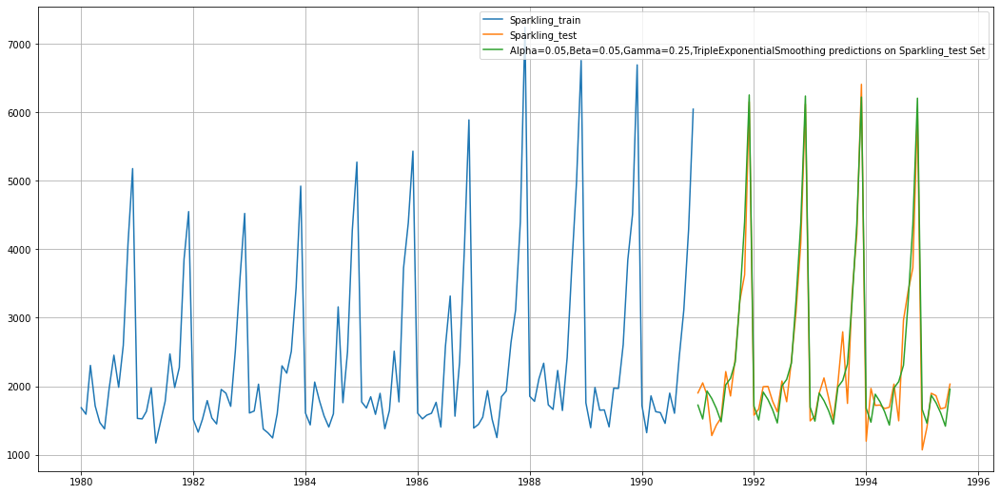

In [108]:
plt.figure(figsize=(18,9))
plt.plot(TES_Sparkling_train['Sparkling'], label='Sparkling_train')
plt.plot(TES_Sparkling_test['Sparkling'], label='Sparkling_test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_Sparkling_test['predict', 0.05,0.05,0.25], label='Alpha=0.05,Beta=0.05,Gamma=0.25,TripleExponentialSmoothing predictions on Sparkling_test Set')


plt.legend(loc='best')
plt.grid();

In [109]:
results_SparklingDf_8_3 = pd.DataFrame({'Sparkling_test RMSE': [results_SparklingDf_8_2.sort_values(by=['Sparkling_test RMSE']).values[0][4]]}
                           ,index=['Alpha=0.05,Beta=0.05,Gamma=0.25,TripleExponentialSmoothing'])

results_SparklingDf = pd.concat([results_SparklingDf, results_SparklingDf_8_3])
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487
"Alpha=0.05,SimpleExponentialSmoothing",1316.411742
"Alpha =0.64,Beta=0,DoubleExponentialSmoothing",2007.238526


For this data, we had both trend and seasonality so by definition Triple Exponential Smoothing is supposed to work better than the Simple Exponential Smoothing as well as the Double Exponential Smoothing. However, since this was a model building exercise we had gone on to build different models on the data and have compared these model with the best RMSE value on the Sparkling_test data.

# Question 5

# Check for the stationarity of the data on which the model is being built on using appropriate statistical tests and also mention the hypothesis for the statistical test. If the data is found to be non-stationary, take appropriate steps to make it stationary. Check the new data for stationarity and comment. Note: Stationarity should be checked at alpha = 0.05.

# use Augmented Dickey–Fuller test 

Null Hypothesis: Data is non -stationary

Alternate Hypothesis : Data is stationary

Alpha = 0.05,

In [110]:
from statsmodels.tsa.stattools import adfuller
def Sparkling_test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=5).mean() #determining the rolling mean
    rolstd = timeseries.rolling(window=5).std()   #determining the rolling standard deviation

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller Sparkling_test:
    print ('Results of Dickey-Fuller Sparkling_test:')
    dfSparkling_test = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dfSparkling_test[0:4], index=['Sparkling_test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dfSparkling_test[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

# testing stationary on whole data

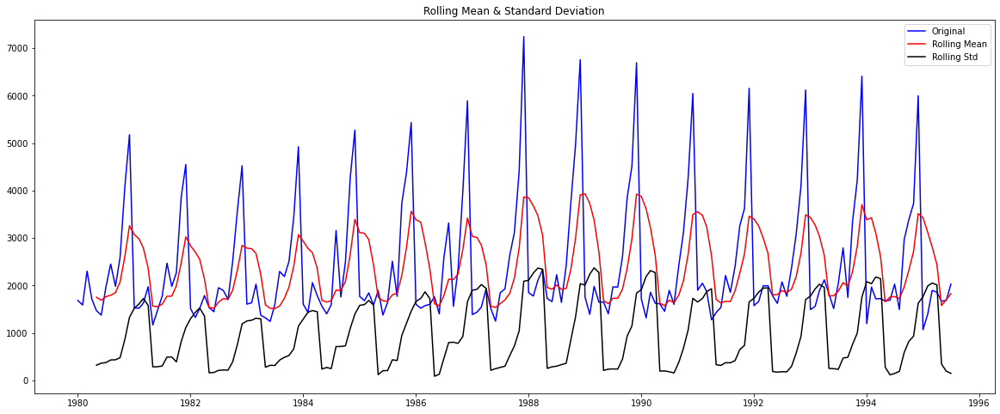

Results of Dickey-Fuller Sparkling_test:
Sparkling_test Statistic        -1.360497
p-value                          0.601061
#Lags Used                      11.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [111]:
Sparkling_test_stationarity(Sparkling['Sparkling'])

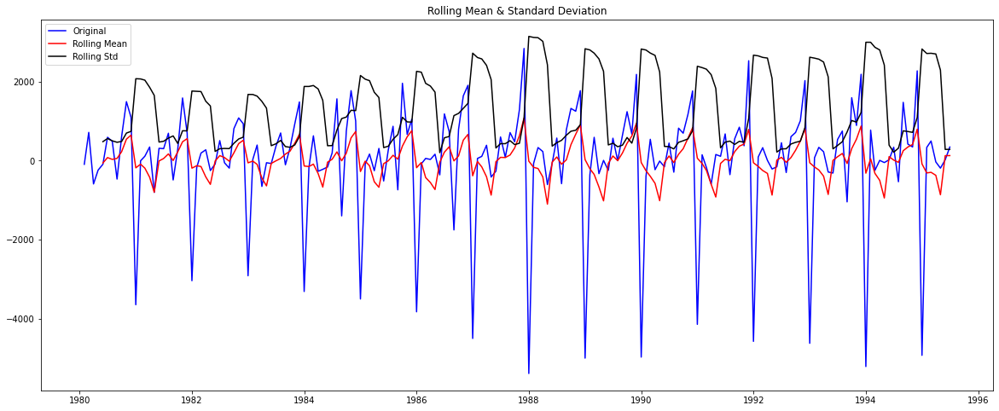

Results of Dickey-Fuller Sparkling_test:
Sparkling_test Statistic       -45.050301
p-value                          0.000000
#Lags Used                      10.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [112]:
Sparkling_test_stationarity(Sparkling['Sparkling'].diff().dropna())

# plot autocorrelation and partial autocorrelation on whole data

In [113]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

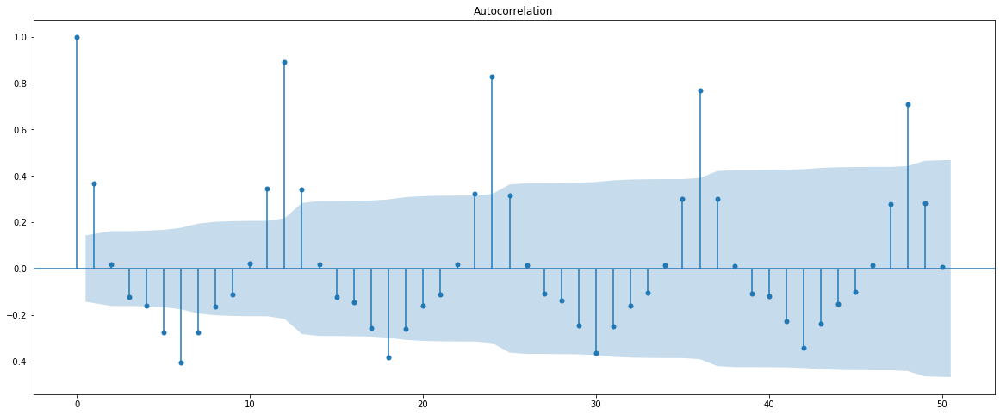

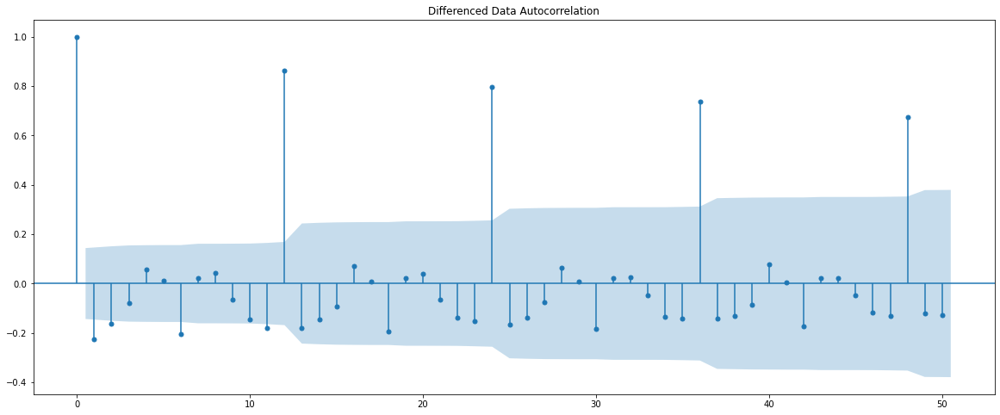

In [114]:
plot_acf(Sparkling['Sparkling'],lags=50)
plot_acf(Sparkling['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plt.show()

C:\Users\User\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1434: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1434: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


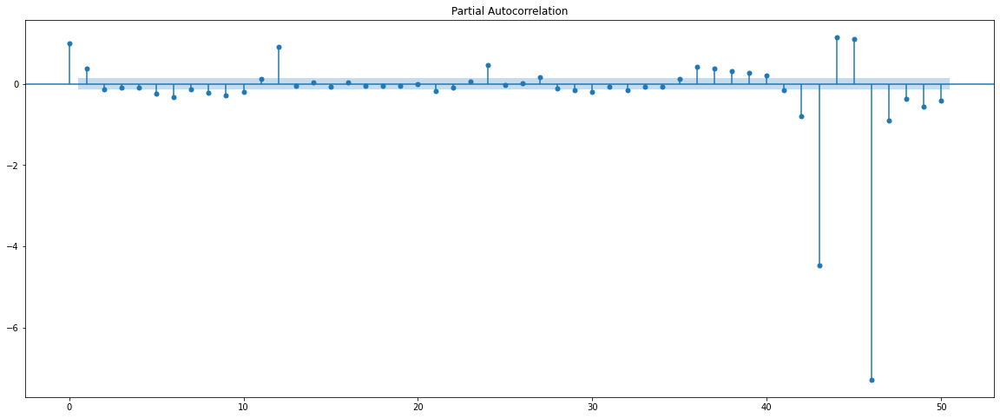

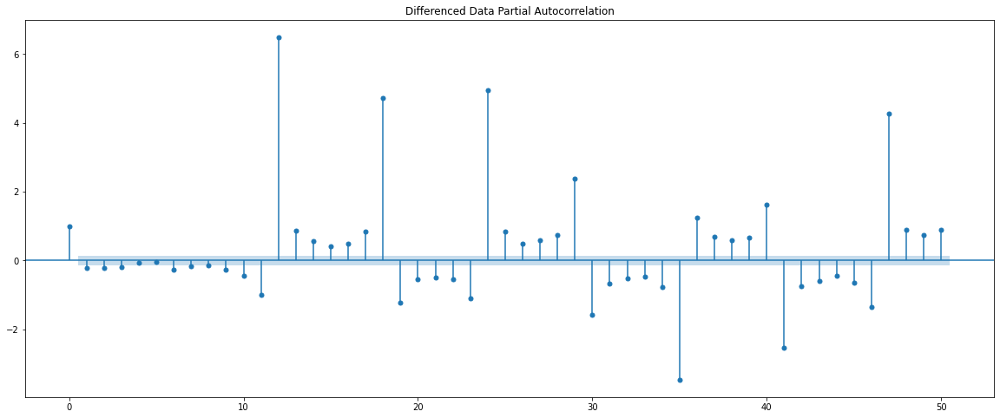

In [115]:
plot_pacf(Sparkling['Sparkling'],lags=50)
plot_pacf(Sparkling['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

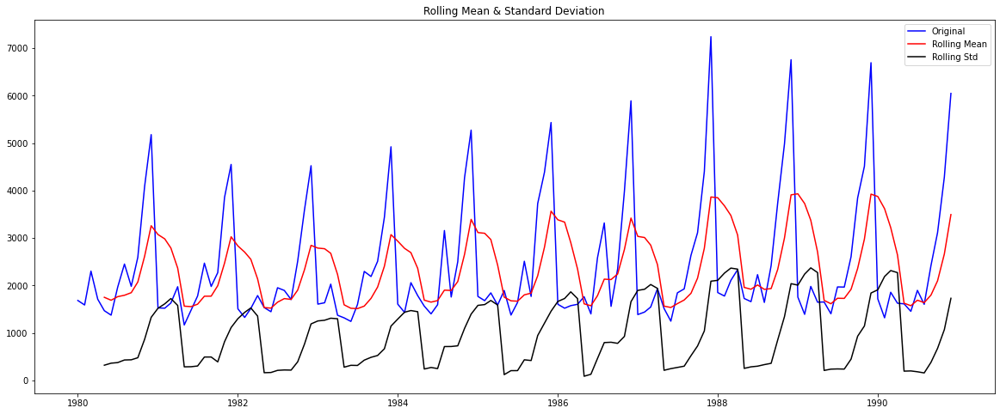

Results of Dickey-Fuller Sparkling_test:
Sparkling_test Statistic        -1.208926
p-value                          0.669744
#Lags Used                      12.000000
Number of Observations Used    119.000000
Critical Value (1%)             -3.486535
Critical Value (5%)             -2.886151
Critical Value (10%)            -2.579896
dtype: float64 



In [116]:
Sparkling_test_stationarity(Sparkling_train['Sparkling'])

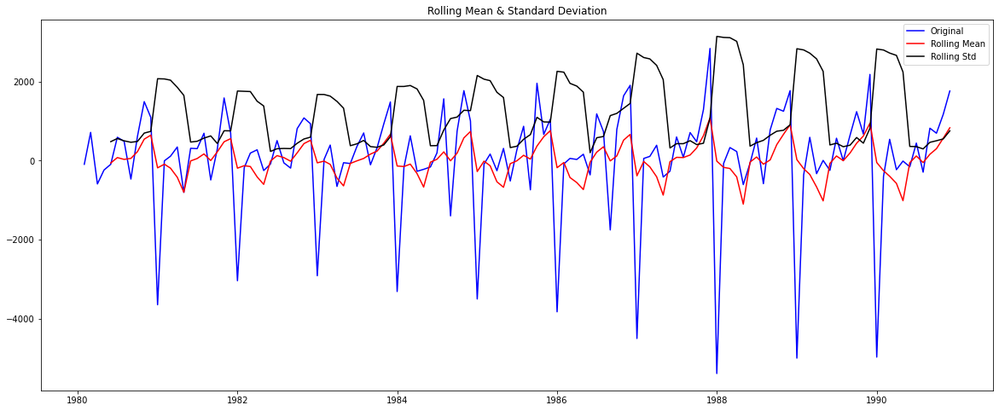

Results of Dickey-Fuller Sparkling_test:
Sparkling_test Statistic      -8.005007e+00
p-value                        2.280104e-12
#Lags Used                     1.100000e+01
Number of Observations Used    1.190000e+02
Critical Value (1%)           -3.486535e+00
Critical Value (5%)           -2.886151e+00
Critical Value (10%)          -2.579896e+00
dtype: float64 



In [117]:
Sparkling_test_stationarity(Sparkling_train['Sparkling'].diff().dropna())

# Question 6

# Build an automated version of the ARIMA/SARIMA model in which the parameters are selected using the lowest Akaike Information Criteria (AIC) on the training data and evaluate this model on the test data using RMSE.

In [118]:
import itertools
p = q = range(0, 3)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)


In [119]:
Sparkling_ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
Sparkling_ARIMA_AIC

,param,AIC


In [120]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_model = ARIMA(Sparkling_train['Sparkling'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))
    Sparkling_ARIMA_AIC = Sparkling_ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


ARIMA(0, 1, 0) - AIC:2269.582796371201
ARIMA(0, 1, 1) - AIC:2264.906438611577
ARIMA(0, 1, 2) - AIC:2232.78309768405
ARIMA(1, 1, 0) - AIC:2268.5280607650034
ARIMA(1, 1, 1) - AIC:2235.0139453493175
ARIMA(1, 1, 2) - AIC:2233.597647121205
ARIMA(2, 1, 0) - AIC:2262.035600155025
ARIMA(2, 1, 1) - AIC:2232.3604899121387
ARIMA(2, 1, 2) - AIC:2210.6260491378257


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


In [121]:
Sparkling_ARIMA_AIC.sort_values(by='AIC',ascending=True)

,param,AIC
8,"(2, 1, 2)",2210.626049
7,"(2, 1, 1)",2232.360490
2,"(0, 1, 2)",2232.783098
5,"(1, 1, 2)",2233.597647
4,"(1, 1, 1)",2235.013945
6,"(2, 1, 0)",2262.035600
1,"(0, 1, 1)",2264.906439
3,"(1, 1, 0)",2268.528061
0,"(0, 1, 0)",2269.582796


In [122]:
Sparkling_Auto_ARIMA = ARIMA(Sparkling_train['Sparkling'], order=(2,1,2))

results_Sparkling_Auto_ARIMA = Sparkling_Auto_ARIMA.fit()

print(results_Sparkling_Auto_ARIMA.summary())

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will

                             ARIMA Model Results                              
Dep. Variable:            D.Sparkling   No. Observations:                  131
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -1099.313
Method:                       css-mle   S.D. of innovations           1013.755
Date:                Wed, 13 Apr 2022   AIC                           2210.626
Time:                        19:58:21   BIC                           2227.877
Sample:                    02-01-1980   HQIC                          2217.636
                         - 12-01-1990                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 5.5845      0.519     10.753      0.000       4.567       6.602
ar.L1.D.Sparkling     1.2698      0.075     17.040      0.000       1.124       1.416
ar.L2.D.Sparkling    -0.

C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


# Predict on the Sparkling_test Set using this model and evaluate the model.

In [123]:
predicted_Sparkling_Auto_ARIMA = results_Sparkling_Auto_ARIMA.forecast(steps=len(Sparkling_test))

In [124]:
from sklearn.metrics import  mean_squared_error
rmse = mean_squared_error(Sparkling_test['Sparkling'],predicted_Sparkling_Auto_ARIMA[0],squared=False)
print(rmse)

1374.0370092580251


In [125]:
results_SparklingDf9 = pd.DataFrame({'Sparkling_test RMSE': [rmse]}
                           ,index=['ARIMA(2,1,2)'])

results_SparklingDf9

,Sparkling_test RMSE
"ARIMA(2,1,2)",1374.037009


In [126]:
results_SparklingDf = pd.concat([results_SparklingDf, results_SparklingDf9])
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487
"Alpha=0.05,SimpleExponentialSmoothing",1316.411742
"Alpha =0.64,Beta=0,DoubleExponentialSmoothing",2007.238526


# Build an Automated version of a SARIMA model for which the best parameters are selected in accordance with the lowest Akaike Information Criteria (AIC)

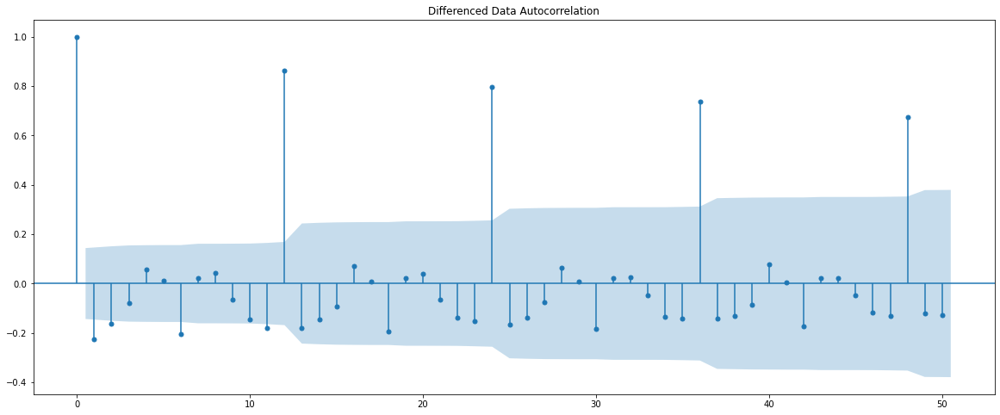

In [127]:
plot_acf(Sparkling['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plt.show()

# Setting the seasonality as 6

In [128]:
import itertools
p = q = range(1, 4)
d= range(1,2)
D = range(1,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 6) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (1, 1, 2)(1, 1, 2, 6)
Model: (1, 1, 3)(1, 1, 3, 6)
Model: (2, 1, 1)(2, 1, 1, 6)
Model: (2, 1, 2)(2, 1, 2, 6)
Model: (2, 1, 3)(2, 1, 3, 6)
Model: (3, 1, 1)(3, 1, 1, 6)
Model: (3, 1, 2)(3, 1, 2, 6)
Model: (3, 1, 3)(3, 1, 3, 6)


In [129]:
Sparkling_SARIMA_AIC1 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
Sparkling_SARIMA_AIC1

,param,seasonal,AIC


In [131]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model = sm.tsa.statespace.SARIMAX(Sparkling_train['Sparkling'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_Sparkling_SARIMA = SARIMA_model.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_Sparkling_SARIMA.aic))
        Sparkling_SARIMA_AIC1 = Sparkling_SARIMA_AIC1.append({'param':param,'seasonal':param_seasonal ,'AIC': results_Sparkling_SARIMA.aic}, ignore_index=True)

SARIMA(1, 1, 1)x(1, 1, 1, 6) - AIC:1760.4963381857435
SARIMA(1, 1, 1)x(1, 1, 2, 6) - AIC:1655.5110715278201
SARIMA(1, 1, 1)x(1, 1, 3, 6) - AIC:1623.1330440512236
SARIMA(1, 1, 1)x(2, 1, 1, 6) - AIC:1690.3773292525304
SARIMA(1, 1, 1)x(2, 1, 2, 6) - AIC:1657.2916498236793
SARIMA(1, 1, 1)x(2, 1, 3, 6) - AIC:1575.2886682966155
SARIMA(1, 1, 1)x(3, 1, 1, 6) - AIC:1593.9047168811508
SARIMA(1, 1, 1)x(3, 1, 2, 6) - AIC:1599.050689484147
SARIMA(1, 1, 1)x(3, 1, 3, 6) - AIC:1610.3571184053978
SARIMA(1, 1, 2)x(1, 1, 1, 6) - AIC:1745.8253726051923
SARIMA(1, 1, 2)x(1, 1, 2, 6) - AIC:1661.1478378241973
SARIMA(1, 1, 2)x(1, 1, 3, 6) - AIC:1557.937223504288
SARIMA(1, 1, 2)x(2, 1, 1, 6) - AIC:1692.38530632249
SARIMA(1, 1, 2)x(2, 1, 2, 6) - AIC:1642.0773198079419
SARIMA(1, 1, 2)x(2, 1, 3, 6) - AIC:1563.895031888661
SARIMA(1, 1, 2)x(3, 1, 1, 6) - AIC:1591.2131974011184
SARIMA(1, 1, 2)x(3, 1, 2, 6) - AIC:1591.3430410373799
SARIMA(1, 1, 2)x(3, 1, 3, 6) - AIC:1561.1891220291186
SARIMA(1, 1, 3)x(1, 1, 1, 6) - AI

In [132]:
Sparkling_SARIMA_AIC1.sort_values(by=['AIC']).head()

,param,seasonal,AIC
50,"(2, 1, 3)","(2, 1, 3, 6)",1540.893165
74,"(3, 1, 3)","(1, 1, 3, 6)",1540.972904
77,"(3, 1, 3)","(2, 1, 3, 6)",1544.662973
20,"(1, 1, 3)","(1, 1, 3, 6)",1544.891800
47,"(2, 1, 3)","(1, 1, 3, 6)",1545.465564


# We see that the model built with lowest AIC comes out to be with parameters for ARIMA as (2, 1, 3) and seasonal Arima as (1, 1, 3, 6)

In [133]:
import statsmodels.api as sm

auto_Sparkling_SARIMA_6 = sm.tsa.statespace.SARIMAX(Sparkling_train['Sparkling'].values,
                                order=(2, 1, 3),
                                seasonal_order=(1, 1, 3, 6),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_Sparkling_SARIMA_6 = auto_Sparkling_SARIMA_6.fit(maxiter=1000)
print(results_auto_Sparkling_SARIMA_6.summary())

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  132
Model:             SARIMAX(2, 1, 3)x(1, 1, 3, 6)   Log Likelihood                -762.733
Date:                           Wed, 13 Apr 2022   AIC                           1545.466
Time:                                   20:10:21   BIC                           1571.813
Sample:                                        0   HQIC                          1556.137
                                           - 132                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0906      0.490      0.185      0.853      -0.870       1.052
ar.L2          0.4640      0.531      0.874

C:\Users\User\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


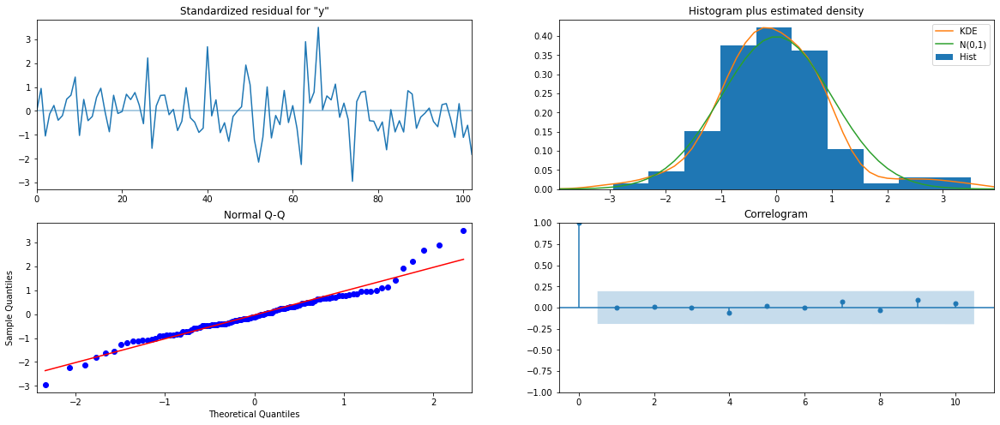

In [134]:
results_auto_Sparkling_SARIMA_6.plot_diagnostics()
plt.show()

# Predict on the Sparkling_test Set using this model and evaluate the model.

In [135]:
predicted_auto_Sparkling_SARIMA_6 = results_auto_Sparkling_SARIMA_6.get_forecast(steps=len(Sparkling_test))

In [136]:
predicted_auto_Sparkling_SARIMA_6.summary_frame().head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1338.387445,392.172885,569.742714,2107.032175
1,1055.415641,402.101820,267.310556,1843.520726
2,1637.075858,402.186730,848.804353,2425.347364
3,1515.674341,407.971787,716.064333,2315.284350
4,1118.221576,409.109582,316.381529,1920.061624


In [137]:
rmse = mean_squared_error(Sparkling_test['Sparkling'],predicted_auto_Sparkling_SARIMA_6.predicted_mean,squared=False)
print(rmse)

949.9818439520075


In [138]:
temp_results_SparklingDf = pd.DataFrame({'Sparkling_test RMSE': [rmse]}
                           ,index=['SARIMA(2, 1, 3),(1, 1, 3, 6)'])


results_SparklingDf = pd.concat([results_SparklingDf,temp_results_SparklingDf])

results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487
"Alpha=0.05,SimpleExponentialSmoothing",1316.411742
"Alpha =0.64,Beta=0,DoubleExponentialSmoothing",2007.238526


# Setting the seasonality as 12

In [139]:
import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(1,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 1, 1, 12)
Model: (0, 1, 2)(0, 1, 2, 12)
Model: (0, 1, 3)(0, 1, 3, 12)
Model: (1, 1, 0)(1, 1, 0, 12)
Model: (1, 1, 1)(1, 1, 1, 12)
Model: (1, 1, 2)(1, 1, 2, 12)
Model: (1, 1, 3)(1, 1, 3, 12)
Model: (2, 1, 0)(2, 1, 0, 12)
Model: (2, 1, 1)(2, 1, 1, 12)
Model: (2, 1, 2)(2, 1, 2, 12)
Model: (2, 1, 3)(2, 1, 3, 12)
Model: (3, 1, 0)(3, 1, 0, 12)
Model: (3, 1, 1)(3, 1, 1, 12)
Model: (3, 1, 2)(3, 1, 2, 12)
Model: (3, 1, 3)(3, 1, 3, 12)


In [140]:
Sparkling_SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
Sparkling_SARIMA_AIC

,param,seasonal,AIC


In [141]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model = sm.tsa.statespace.SARIMAX(Sparkling_train['Sparkling'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_Sparkling_SARIMA = SARIMA_model.fit(maxiter=10000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_Sparkling_SARIMA.aic))
        Sparkling_SARIMA_AIC = Sparkling_SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_Sparkling_SARIMA.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 1, 0, 12) - AIC:1822.9824851895298
SARIMA(0, 1, 0)x(0, 1, 1, 12) - AIC:1626.8626334678963
SARIMA(0, 1, 0)x(0, 1, 2, 12) - AIC:1452.677357426081


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(0, 1, 3, 12) - AIC:2514.604990294863
SARIMA(0, 1, 0)x(1, 1, 0, 12) - AIC:1646.377816766144
SARIMA(0, 1, 0)x(1, 1, 1, 12) - AIC:1628.32439081859
SARIMA(0, 1, 0)x(1, 1, 2, 12) - AIC:1454.5289621306945
SARIMA(0, 1, 0)x(1, 1, 3, 12) - AIC:3405.483982327003
SARIMA(0, 1, 0)x(2, 1, 0, 12) - AIC:1466.6211360755017
SARIMA(0, 1, 0)x(2, 1, 1, 12) - AIC:1468.500098186662
SARIMA(0, 1, 0)x(2, 1, 2, 12) - AIC:1455.9911553658967


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(2, 1, 3, 12) - AIC:3266.351768752799
SARIMA(0, 1, 0)x(3, 1, 0, 12) - AIC:1289.2398197439918
SARIMA(0, 1, 0)x(3, 1, 1, 12) - AIC:1291.2448875094105
SARIMA(0, 1, 0)x(3, 1, 2, 12) - AIC:1288.607038030959


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(3, 1, 3, 12) - AIC:3462.076992723248
SARIMA(0, 1, 1)x(0, 1, 0, 12) - AIC:1760.6565719828523
SARIMA(0, 1, 1)x(0, 1, 1, 12) - AIC:1569.6639234230142
SARIMA(0, 1, 1)x(0, 1, 2, 12) - AIC:1399.108384668


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(0, 1, 3, 12) - AIC:3412.6236456190622
SARIMA(0, 1, 1)x(1, 1, 0, 12) - AIC:1602.8594819023883
SARIMA(0, 1, 1)x(1, 1, 1, 12) - AIC:1570.8550259195656
SARIMA(0, 1, 1)x(1, 1, 2, 12) - AIC:1400.6709524136802


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(1, 1, 3, 12) - AIC:3621.740104502566
SARIMA(0, 1, 1)x(2, 1, 0, 12) - AIC:1428.2448811159443
SARIMA(0, 1, 1)x(2, 1, 1, 12) - AIC:1429.6168027963352
SARIMA(0, 1, 1)x(2, 1, 2, 12) - AIC:1402.6385888565403


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(2, 1, 3, 12) - AIC:3618.1926260363052
SARIMA(0, 1, 1)x(3, 1, 0, 12) - AIC:1255.5784542932213
SARIMA(0, 1, 1)x(3, 1, 1, 12) - AIC:1257.4558568590317
SARIMA(0, 1, 1)x(3, 1, 2, 12) - AIC:1258.2925125564832


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(3, 1, 3, 12) - AIC:3679.0759149302703
SARIMA(0, 1, 2)x(0, 1, 0, 12) - AIC:1741.3207220431611
SARIMA(0, 1, 2)x(0, 1, 1, 12) - AIC:1554.7429039622837
SARIMA(0, 1, 2)x(0, 1, 2, 12) - AIC:1382.4842540785048


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(0, 1, 3, 12) - AIC:2492.144329058009
SARIMA(0, 1, 2)x(1, 1, 0, 12) - AIC:1601.7587293000731
SARIMA(0, 1, 2)x(1, 1, 1, 12) - AIC:1556.1559716161537
SARIMA(0, 1, 2)x(1, 1, 2, 12) - AIC:1384.3988672021196
SARIMA(0, 1, 2)x(1, 1, 3, 12) - AIC:3309.112302943463
SARIMA(0, 1, 2)x(2, 1, 0, 12) - AIC:1427.0773414919145
SARIMA(0, 1, 2)x(2, 1, 1, 12) - AIC:1428.5534767511099
SARIMA(0, 1, 2)x(2, 1, 2, 12) - AIC:1386.0237342663688


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(2, 1, 3, 12) - AIC:3235.89371426031
SARIMA(0, 1, 2)x(3, 1, 0, 12) - AIC:1254.652557926444
SARIMA(0, 1, 2)x(3, 1, 1, 12) - AIC:1256.9866634020257
SARIMA(0, 1, 2)x(3, 1, 2, 12) - AIC:1257.4253258733809
SARIMA(0, 1, 2)x(3, 1, 3, 12) - AIC:2214.4732259405837
SARIMA(0, 1, 3)x(0, 1, 0, 12) - AIC:1727.260737827519
SARIMA(0, 1, 3)x(0, 1, 1, 12) - AIC:1540.7948184312668
SARIMA(0, 1, 3)x(0, 1, 2, 12) - AIC:1369.9603671034893


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(0, 1, 3, 12) - AIC:3588.4256331288725
SARIMA(0, 1, 3)x(1, 1, 0, 12) - AIC:1602.1924100608744
SARIMA(0, 1, 3)x(1, 1, 1, 12) - AIC:1542.6814540451353
SARIMA(0, 1, 3)x(1, 1, 2, 12) - AIC:1371.7363271447018


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(1, 1, 3, 12) - AIC:3528.5466706640486
SARIMA(0, 1, 3)x(2, 1, 0, 12) - AIC:1428.3896856876945
SARIMA(0, 1, 3)x(2, 1, 1, 12) - AIC:1429.8265181250456
SARIMA(0, 1, 3)x(2, 1, 2, 12) - AIC:1373.4524731752051


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(2, 1, 3, 12) - AIC:3561.7933196680374
SARIMA(0, 1, 3)x(3, 1, 0, 12) - AIC:1256.0020281099028
SARIMA(0, 1, 3)x(3, 1, 1, 12) - AIC:1258.0747613576837
SARIMA(0, 1, 3)x(3, 1, 2, 12) - AIC:1258.9452629468992


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(3, 1, 3, 12) - AIC:3623.372610554657
SARIMA(1, 1, 0)x(0, 1, 0, 12) - AIC:1810.9513015567375
SARIMA(1, 1, 0)x(0, 1, 1, 12) - AIC:1613.7407033409934
SARIMA(1, 1, 0)x(0, 1, 2, 12) - AIC:1441.4259994233842
SARIMA(1, 1, 0)x(0, 1, 3, 12) - AIC:3194.3958905484847
SARIMA(1, 1, 0)x(1, 1, 0, 12) - AIC:1619.6703363510067
SARIMA(1, 1, 0)x(1, 1, 1, 12) - AIC:1615.7404485221348
SARIMA(1, 1, 0)x(1, 1, 2, 12) - AIC:1443.1035528170999


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(1, 1, 3, 12) - AIC:3485.5825976008473
SARIMA(1, 1, 0)x(2, 1, 0, 12) - AIC:1440.5741628098947
SARIMA(1, 1, 0)x(2, 1, 1, 12) - AIC:1442.5059371248885
SARIMA(1, 1, 0)x(2, 1, 2, 12) - AIC:1444.4274245939228


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(2, 1, 3, 12) - AIC:4006.9236972295466
SARIMA(1, 1, 0)x(3, 1, 0, 12) - AIC:1265.1747644704742
SARIMA(1, 1, 0)x(3, 1, 1, 12) - AIC:1267.1592027274792
SARIMA(1, 1, 0)x(3, 1, 2, 12) - AIC:1263.9849696483511


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(3, 1, 3, 12) - AIC:3450.153116697126
SARIMA(1, 1, 1)x(0, 1, 0, 12) - AIC:1757.3654162745872
SARIMA(1, 1, 1)x(0, 1, 1, 12) - AIC:1569.3827366812761
SARIMA(1, 1, 1)x(0, 1, 2, 12) - AIC:1398.7561672226238


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(0, 1, 3, 12) - AIC:2958.680386364257
SARIMA(1, 1, 1)x(1, 1, 0, 12) - AIC:1588.0655672689265
SARIMA(1, 1, 1)x(1, 1, 1, 12) - AIC:1570.6724644582819
SARIMA(1, 1, 1)x(1, 1, 2, 12) - AIC:1400.452388615048


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 1, 3, 12) - AIC:2660.634373263125
SARIMA(1, 1, 1)x(2, 1, 0, 12) - AIC:1413.5679859610987
SARIMA(1, 1, 1)x(2, 1, 1, 12) - AIC:1414.8736681604653
SARIMA(1, 1, 1)x(2, 1, 2, 12) - AIC:1402.2732672818809


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(2, 1, 3, 12) - AIC:2661.888751087058
SARIMA(1, 1, 1)x(3, 1, 0, 12) - AIC:1240.8275546107775
SARIMA(1, 1, 1)x(3, 1, 1, 12) - AIC:1242.664098885306
SARIMA(1, 1, 1)x(3, 1, 2, 12) - AIC:1243.114500532586
SARIMA(1, 1, 1)x(3, 1, 3, 12) - AIC:3424.3642965583394
SARIMA(1, 1, 2)x(0, 1, 0, 12) - AIC:1742.7366275449765
SARIMA(1, 1, 2)x(0, 1, 1, 12) - AIC:1554.9584139021176
SARIMA(1, 1, 2)x(0, 1, 2, 12) - AIC:1382.347780033087


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(0, 1, 3, 12) - AIC:2989.3586976384663
SARIMA(1, 1, 2)x(1, 1, 0, 12) - AIC:1585.7860900921376
SARIMA(1, 1, 2)x(1, 1, 1, 12) - AIC:1556.1300441713577
SARIMA(1, 1, 2)x(1, 1, 2, 12) - AIC:1384.1378738607905


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(1, 1, 3, 12) - AIC:3178.322499976466
SARIMA(1, 1, 2)x(2, 1, 0, 12) - AIC:1411.9924109678727
SARIMA(1, 1, 2)x(2, 1, 1, 12) - AIC:1413.5918294003477
SARIMA(1, 1, 2)x(2, 1, 2, 12) - AIC:1385.6887207766583


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(2, 1, 3, 12) - AIC:3163.4398225241966
SARIMA(1, 1, 2)x(3, 1, 0, 12) - AIC:1240.4397939411929
SARIMA(1, 1, 2)x(3, 1, 1, 12) - AIC:1242.334037800113
SARIMA(1, 1, 2)x(3, 1, 2, 12) - AIC:1242.9811909807297


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(3, 1, 3, 12) - AIC:3286.3086985819446
SARIMA(1, 1, 3)x(0, 1, 0, 12) - AIC:1727.0466394221062
SARIMA(1, 1, 3)x(0, 1, 1, 12) - AIC:1541.6027948082108
SARIMA(1, 1, 3)x(0, 1, 2, 12) - AIC:1370.6605716693687
SARIMA(1, 1, 3)x(0, 1, 3, 12) - AIC:16.0
SARIMA(1, 1, 3)x(1, 1, 0, 12) - AIC:1587.782481940475
SARIMA(1, 1, 3)x(1, 1, 1, 12) - AIC:1544.6047622975807
SARIMA(1, 1, 3)x(1, 1, 2, 12) - AIC:1372.214306954615


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(1, 1, 3, 12) - AIC:870.8554098857633
SARIMA(1, 1, 3)x(2, 1, 0, 12) - AIC:1413.9496333328918
SARIMA(1, 1, 3)x(2, 1, 1, 12) - AIC:1415.56046944831
SARIMA(1, 1, 3)x(2, 1, 2, 12) - AIC:1373.715301511296


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(2, 1, 3, 12) - AIC:949.0229009414452
SARIMA(1, 1, 3)x(3, 1, 0, 12) - AIC:1242.8330948723258
SARIMA(1, 1, 3)x(3, 1, 1, 12) - AIC:1244.8227467701947
SARIMA(1, 1, 3)x(3, 1, 2, 12) - AIC:1245.446624695193


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(3, 1, 3, 12) - AIC:3693.4869711059723
SARIMA(2, 1, 0)x(0, 1, 0, 12) - AIC:1779.6359486658964
SARIMA(2, 1, 0)x(0, 1, 1, 12) - AIC:1599.8657465662807
SARIMA(2, 1, 0)x(0, 1, 2, 12) - AIC:1429.6023214913455


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(0, 1, 3, 12) - AIC:3117.1834924784453
SARIMA(2, 1, 0)x(1, 1, 0, 12) - AIC:1590.6714007730445
SARIMA(2, 1, 0)x(1, 1, 1, 12) - AIC:1587.5144246574564
SARIMA(2, 1, 0)x(1, 1, 2, 12) - AIC:1431.1873135879378


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(1, 1, 3, 12) - AIC:3300.3929792153194
SARIMA(2, 1, 0)x(2, 1, 0, 12) - AIC:1413.6736725426342
SARIMA(2, 1, 0)x(2, 1, 1, 12) - AIC:1415.6324293971195
SARIMA(2, 1, 0)x(2, 1, 2, 12) - AIC:1417.3668472985253


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(2, 1, 3, 12) - AIC:3331.332305660363
SARIMA(2, 1, 0)x(3, 1, 0, 12) - AIC:1240.8917512199246
SARIMA(2, 1, 0)x(3, 1, 1, 12) - AIC:1242.8745815841773
SARIMA(2, 1, 0)x(3, 1, 2, 12) - AIC:1242.7991703357504


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(3, 1, 3, 12) - AIC:3293.3999381634308
SARIMA(2, 1, 1)x(0, 1, 0, 12) - AIC:1758.5616376866824
SARIMA(2, 1, 1)x(0, 1, 1, 12) - AIC:1570.175592261096
SARIMA(2, 1, 1)x(0, 1, 2, 12) - AIC:1400.2098581807288


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(0, 1, 3, 12) - AIC:3043.5891386563926
SARIMA(2, 1, 1)x(1, 1, 0, 12) - AIC:1574.3724067255444
SARIMA(2, 1, 1)x(1, 1, 1, 12) - AIC:1571.8577388006777
SARIMA(2, 1, 1)x(1, 1, 2, 12) - AIC:1401.9104199706742


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(1, 1, 3, 12) - AIC:3618.8143323395993
SARIMA(2, 1, 1)x(2, 1, 0, 12) - AIC:1400.9854069823177
SARIMA(2, 1, 1)x(2, 1, 1, 12) - AIC:1401.992473547397
SARIMA(2, 1, 1)x(2, 1, 2, 12) - AIC:1403.8183455444896


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(2, 1, 3, 12) - AIC:3609.003085705532
SARIMA(2, 1, 1)x(3, 1, 0, 12) - AIC:1228.3132766082442
SARIMA(2, 1, 1)x(3, 1, 1, 12) - AIC:1230.1483342049005
SARIMA(2, 1, 1)x(3, 1, 2, 12) - AIC:1230.7597823057356


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(3, 1, 3, 12) - AIC:3365.8345932104407
SARIMA(2, 1, 2)x(0, 1, 0, 12) - AIC:1742.2930709411937
SARIMA(2, 1, 2)x(0, 1, 1, 12) - AIC:1556.946732412197
SARIMA(2, 1, 2)x(0, 1, 2, 12) - AIC:1384.3176180645141


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(0, 1, 3, 12) - AIC:2567.4976493676245
SARIMA(2, 1, 2)x(1, 1, 0, 12) - AIC:1573.1168644411416
SARIMA(2, 1, 2)x(1, 1, 1, 12) - AIC:1558.1200892461684
SARIMA(2, 1, 2)x(1, 1, 2, 12) - AIC:1386.0972420305134


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 1, 3, 12) - AIC:2873.1170640203586
SARIMA(2, 1, 2)x(2, 1, 0, 12) - AIC:1399.7756339990376
SARIMA(2, 1, 2)x(2, 1, 1, 12) - AIC:1401.1832161215614
SARIMA(2, 1, 2)x(2, 1, 2, 12) - AIC:1387.627784628074


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 1, 3, 12) - AIC:2917.229132704271
SARIMA(2, 1, 2)x(3, 1, 0, 12) - AIC:1228.397167741215
SARIMA(2, 1, 2)x(3, 1, 1, 12) - AIC:1230.2093707033969
SARIMA(2, 1, 2)x(3, 1, 2, 12) - AIC:1230.6856819222285


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(3, 1, 3, 12) - AIC:2842.261508642949
SARIMA(2, 1, 3)x(0, 1, 0, 12) - AIC:1729.00804150138
SARIMA(2, 1, 3)x(0, 1, 1, 12) - AIC:1539.8879480458118
SARIMA(2, 1, 3)x(0, 1, 2, 12) - AIC:1368.1431667705265
SARIMA(2, 1, 3)x(0, 1, 3, 12) - AIC:18.0
SARIMA(2, 1, 3)x(1, 1, 0, 12) - AIC:1571.5669140323575
SARIMA(2, 1, 3)x(1, 1, 1, 12) - AIC:1541.4635817724661
SARIMA(2, 1, 3)x(1, 1, 2, 12) - AIC:1369.7748094244998


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(1, 1, 3, 12) - AIC:905.5995908870705
SARIMA(2, 1, 3)x(2, 1, 0, 12) - AIC:1396.0596575168584
SARIMA(2, 1, 3)x(2, 1, 1, 12) - AIC:1397.8640335766172
SARIMA(2, 1, 3)x(2, 1, 2, 12) - AIC:1370.3569923654145
SARIMA(2, 1, 3)x(2, 1, 3, 12) - AIC:22.0
SARIMA(2, 1, 3)x(3, 1, 0, 12) - AIC:1229.469853093542
SARIMA(2, 1, 3)x(3, 1, 1, 12) - AIC:1227.825132149747
SARIMA(2, 1, 3)x(3, 1, 2, 12) - AIC:1229.1522960405073
SARIMA(2, 1, 3)x(3, 1, 3, 12) - AIC:6232.655037460592
SARIMA(3, 1, 0)x(0, 1, 0, 12) - AIC:1761.4099815082702
SARIMA(3, 1, 0)x(0, 1, 1, 12) - AIC:1600.5023389441335
SARIMA(3, 1, 0)x(0, 1, 2, 12) - AIC:1430.3126536702728


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(0, 1, 3, 12) - AIC:3095.994827520633
SARIMA(3, 1, 0)x(1, 1, 0, 12) - AIC:1576.8309567174902
SARIMA(3, 1, 0)x(1, 1, 1, 12) - AIC:1574.5127601482723
SARIMA(3, 1, 0)x(1, 1, 2, 12) - AIC:1431.953462851513


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(1, 1, 3, 12) - AIC:3391.928052102512
SARIMA(3, 1, 0)x(2, 1, 0, 12) - AIC:1398.597004803828
SARIMA(3, 1, 0)x(2, 1, 1, 12) - AIC:1400.4740803600935
SARIMA(3, 1, 0)x(2, 1, 2, 12) - AIC:1402.55274994138


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(2, 1, 3, 12) - AIC:2680.875417217565
SARIMA(3, 1, 0)x(3, 1, 0, 12) - AIC:1227.4630824826081
SARIMA(3, 1, 0)x(3, 1, 1, 12) - AIC:1229.4324419588754
SARIMA(3, 1, 0)x(3, 1, 2, 12) - AIC:1229.1153342154253


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(3, 1, 3, 12) - AIC:3592.239915559134
SARIMA(3, 1, 1)x(0, 1, 0, 12) - AIC:1744.6939375425727
SARIMA(3, 1, 1)x(0, 1, 1, 12) - AIC:1572.0715279677518
SARIMA(3, 1, 1)x(0, 1, 2, 12) - AIC:1401.6807316914756
SARIMA(3, 1, 1)x(0, 1, 3, 12) - AIC:3135.1489756357414
SARIMA(3, 1, 1)x(1, 1, 0, 12) - AIC:1561.8477975464443
SARIMA(3, 1, 1)x(1, 1, 1, 12) - AIC:1559.6931631943532
SARIMA(3, 1, 1)x(1, 1, 2, 12) - AIC:1403.393681302674
SARIMA(3, 1, 1)x(1, 1, 3, 12) - AIC:3365.5206618374086
SARIMA(3, 1, 1)x(2, 1, 0, 12) - AIC:1385.8871646620257
SARIMA(3, 1, 1)x(2, 1, 1, 12) - AIC:1387.5203747530745
SARIMA(3, 1, 1)x(2, 1, 2, 12) - AIC:1389.4969785778007


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(2, 1, 3, 12) - AIC:3611.002817643925
SARIMA(3, 1, 1)x(3, 1, 0, 12) - AIC:1215.8987770406816
SARIMA(3, 1, 1)x(3, 1, 1, 12) - AIC:1217.7138947668946
SARIMA(3, 1, 1)x(3, 1, 2, 12) - AIC:1218.4160436470722


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(3, 1, 3, 12) - AIC:3023.688544054253
SARIMA(3, 1, 2)x(0, 1, 0, 12) - AIC:1744.1714487312827
SARIMA(3, 1, 2)x(0, 1, 1, 12) - AIC:1560.2179700224865
SARIMA(3, 1, 2)x(0, 1, 2, 12) - AIC:1385.8754542228223
SARIMA(3, 1, 2)x(0, 1, 3, 12) - AIC:3125.9823033141793
SARIMA(3, 1, 2)x(1, 1, 0, 12) - AIC:1563.1682989370206
SARIMA(3, 1, 2)x(1, 1, 1, 12) - AIC:1559.6863577173144
SARIMA(3, 1, 2)x(1, 1, 2, 12) - AIC:1387.7123926573743


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(1, 1, 3, 12) - AIC:3316.8995113345127
SARIMA(3, 1, 2)x(2, 1, 0, 12) - AIC:1387.8884447444095
SARIMA(3, 1, 2)x(2, 1, 1, 12) - AIC:1387.2131041089629
SARIMA(3, 1, 2)x(2, 1, 2, 12) - AIC:1389.204666319287


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(2, 1, 3, 12) - AIC:3312.090209772122
SARIMA(3, 1, 2)x(3, 1, 0, 12) - AIC:1216.8591795930565
SARIMA(3, 1, 2)x(3, 1, 1, 12) - AIC:1218.9913842246083
SARIMA(3, 1, 2)x(3, 1, 2, 12) - AIC:1219.2599786044198


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(3, 1, 3, 12) - AIC:2964.5158353214815
SARIMA(3, 1, 3)x(0, 1, 0, 12) - AIC:1730.9862392626496
SARIMA(3, 1, 3)x(0, 1, 1, 12) - AIC:1541.4285925717759
SARIMA(3, 1, 3)x(0, 1, 2, 12) - AIC:1372.4124945487642


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(0, 1, 3, 12) - AIC:1467.8094393892088
SARIMA(3, 1, 3)x(1, 1, 0, 12) - AIC:1559.5316962732286
SARIMA(3, 1, 3)x(1, 1, 1, 12) - AIC:1541.7583701859612
SARIMA(3, 1, 3)x(1, 1, 2, 12) - AIC:1374.3118267224472


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(1, 1, 3, 12) - AIC:3006.350233778186
SARIMA(3, 1, 3)x(2, 1, 0, 12) - AIC:1383.022348651056
SARIMA(3, 1, 3)x(2, 1, 1, 12) - AIC:1384.8828871519017
SARIMA(3, 1, 3)x(2, 1, 2, 12) - AIC:1372.220902699803


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(2, 1, 3, 12) - AIC:3189.032241901683
SARIMA(3, 1, 3)x(3, 1, 0, 12) - AIC:1213.2825561352902
SARIMA(3, 1, 3)x(3, 1, 1, 12) - AIC:1215.2134989475076
SARIMA(3, 1, 3)x(3, 1, 2, 12) - AIC:1216.4799337541785


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(3, 1, 3, 12) - AIC:3340.779473926176


In [142]:
Sparkling_SARIMA_AIC.sort_values(by=['AIC']).head()

,param,seasonal,AIC
115,"(1, 1, 3)","(0, 1, 3, 12)",16.000000
179,"(2, 1, 3)","(0, 1, 3, 12)",18.000000
187,"(2, 1, 3)","(2, 1, 3, 12)",22.000000
119,"(1, 1, 3)","(1, 1, 3, 12)",870.855410
183,"(2, 1, 3)","(1, 1, 3, 12)",905.599591


# We see that the model built with lowest AIC comes out to be with parameters for ARIMA as (1, 1, 3) and seasonal Arima as (3, 1, 0, 12)

In [144]:
import statsmodels.api as sm

auto_Sparkling_SARIMA_12 = sm.tsa.statespace.SARIMAX(Sparkling_train['Sparkling'].values,
                                order=(3, 1, 3),
                                seasonal_order=(3, 1, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_Sparkling_SARIMA_12 = auto_Sparkling_SARIMA_12.fit(maxiter=1000)
print(results_auto_Sparkling_SARIMA_12.summary())

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  132
Model:             SARIMAX(3, 1, 3)x(3, 1, [], 12)   Log Likelihood                -596.641
Date:                             Wed, 13 Apr 2022   AIC                           1213.283
Time:                                     20:23:12   BIC                           1237.103
Sample:                                          0   HQIC                          1222.833
                                             - 132                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.6142      0.176     -9.177      0.000      -1.959      -1.269
ar.L2         -0.6124      

C:\Users\User\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


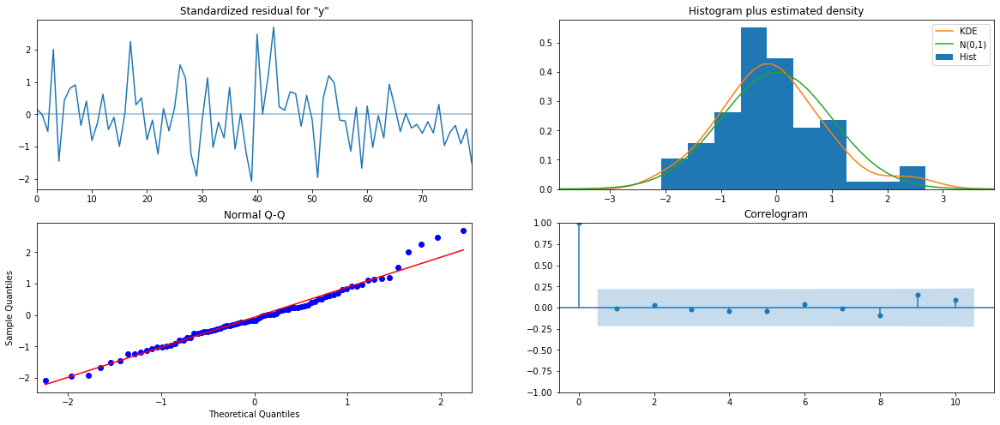

In [145]:
results_auto_Sparkling_SARIMA_12.plot_diagnostics()
plt.show()

# Predict on the Sparkling_test Set using this model and evaluate the model.

In [146]:
predicted_auto_Sparkling_SARIMA_12 = results_auto_Sparkling_SARIMA_12.get_forecast(steps=len(Sparkling_test))

In [147]:
predicted_auto_Sparkling_SARIMA_12.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1430.749854,431.198896,585.615548,2275.884161
1,1540.444729,458.362560,642.070618,2438.818839
2,1707.348305,460.141436,805.487663,2609.208948
3,1858.833607,466.711604,944.095672,2773.571543
4,1501.567686,467.014275,586.236527,2416.898846


In [148]:
rmse = mean_squared_error(Sparkling_test['Sparkling'],predicted_auto_Sparkling_SARIMA_12.predicted_mean,squared=False)
print(rmse)

331.6423871869652


In [180]:
temp_results_SparklingDf = pd.DataFrame({'Sparkling_test RMSE': [rmse]}
                           ,index=['SARIMA(1, 1, 3)(3, 1, 0, 12)'])


results_SparklingDf = pd.concat([results_SparklingDf,temp_results_SparklingDf])

results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487
"Alpha=0.05,SimpleExponentialSmoothing",1316.411742
"Alpha =0.64,Beta=0,DoubleExponentialSmoothing",2007.238526


# Question 7

# Build ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluate this model on the test data using RMSE.

C:\Users\User\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1434: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


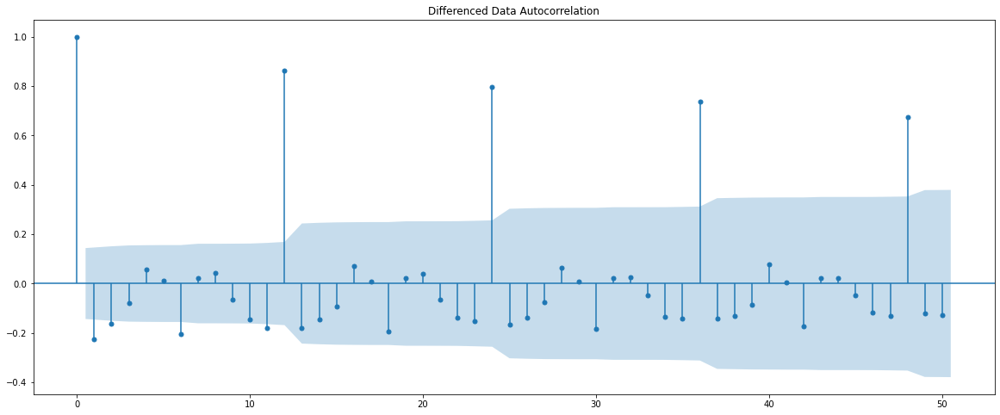

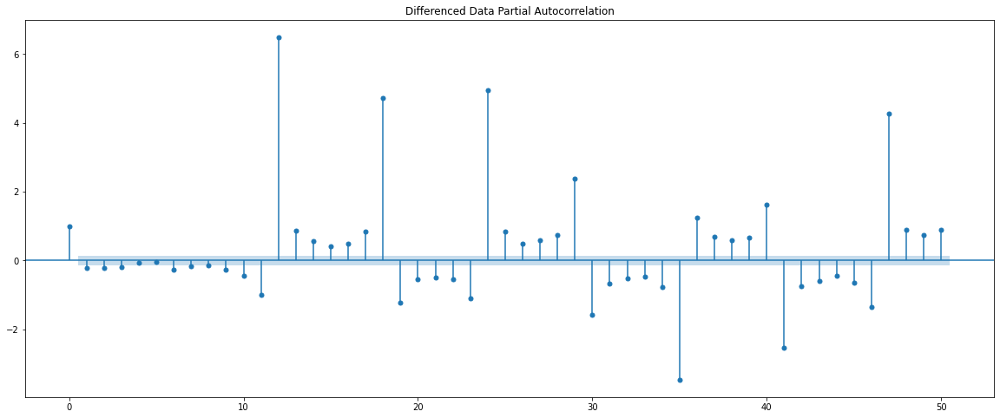

In [150]:
plot_acf(Sparkling['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plot_pacf(Sparkling['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

In [151]:
Sparkling_manual_ARIMA = ARIMA(Sparkling_train['Sparkling'].astype('float64'), order=(2,1,3))

results_Sparkling_manual_ARIMA = Sparkling_manual_ARIMA.fit()

print(results_Sparkling_manual_ARIMA.summary())

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will

                             ARIMA Model Results                              
Dep. Variable:            D.Sparkling   No. Observations:                  131
Model:                 ARIMA(2, 1, 3)   Log Likelihood               -1107.679
Method:                       css-mle   S.D. of innovations           1093.029
Date:                Wed, 13 Apr 2022   AIC                           2229.358
Time:                        20:26:03   BIC                           2249.484
Sample:                    02-01-1980   HQIC                          2237.536
                         - 12-01-1990                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 5.8833      3.397      1.732      0.083      -0.775      12.542
ar.L1.D.Sparkling    -0.8782      0.077    -11.438      0.000      -1.029      -0.728
ar.L2.D.Sparkling    -0.

C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:1521: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.diag(-inv(hess)))


# The AR(p) and the MA(q) model are of order 3 and 4 respectively

# Predict on the Sparkling_test Set using this model and evaluate the model.

In [153]:
predicted_Sparkling_manual_ARIMA = results_Sparkling_manual_ARIMA.forecast(steps=len(Sparkling_test))

In [154]:
rmse = mean_squared_error(Sparkling_test['Sparkling'],predicted_Sparkling_manual_ARIMA[0],squared=False)
print(rmse)

1393.6371851473552


In [155]:
temp_results_SparklingDf = pd.DataFrame({'Sparkling_test RMSE': [rmse]}
                           ,index=['ARIMA(2,1,3)'])


results_SparklingDf = pd.concat([results_SparklingDf,temp_results_SparklingDf])

results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487
"Alpha=0.05,SimpleExponentialSmoothing",1316.411742
"Alpha =0.64,Beta=0,DoubleExponentialSmoothing",2007.238526


# Build a version of the SARIMA model for which the best parameters are selected by looking at the ACF and the PACF plots. - Seasonality at 12.

C:\Users\User\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1434: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


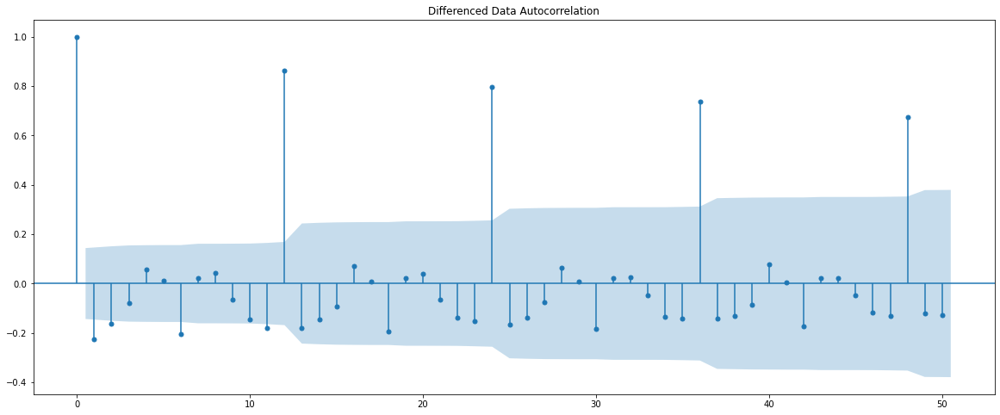

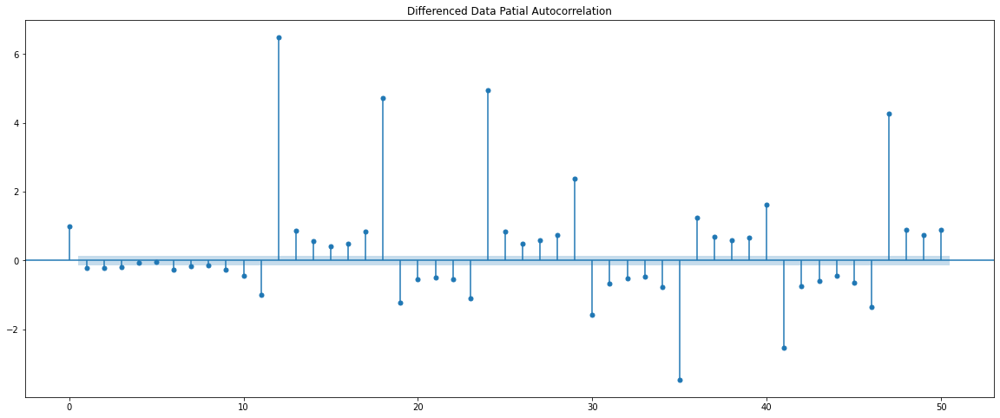

In [156]:
plot_acf(Sparkling['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plot_pacf(Sparkling['Sparkling'].diff().dropna(),lags=50,title='Differenced Data Patial Autocorrelation')
plt.show()

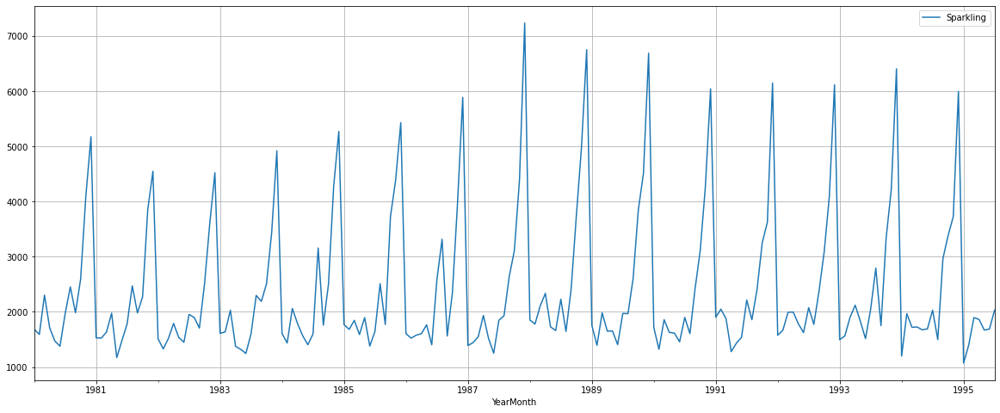

In [157]:
Sparkling.plot()
plt.grid();

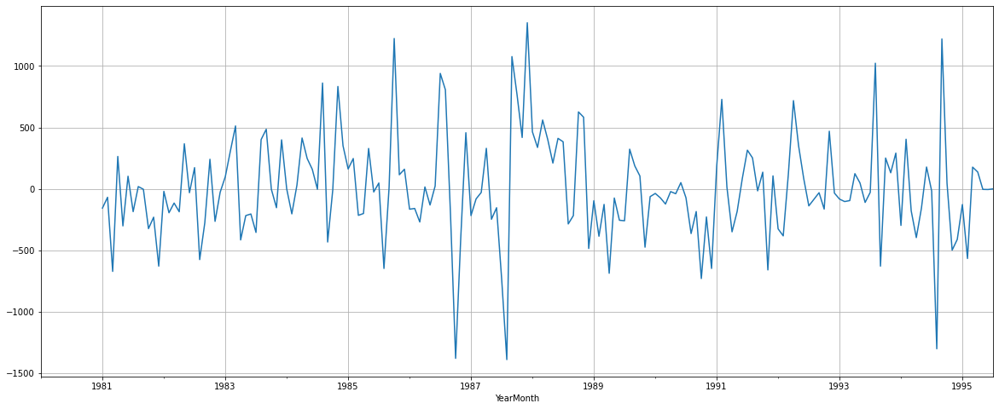

In [158]:
(Sparkling['Sparkling'].diff(12)).plot()
plt.grid();

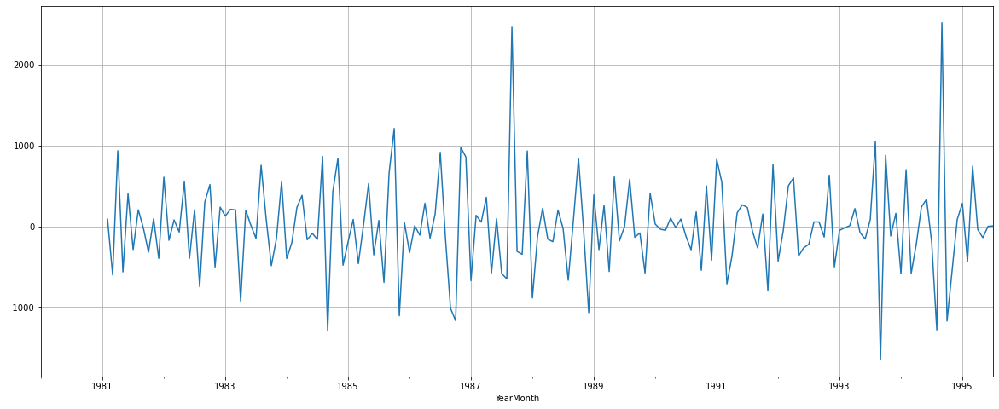

In [159]:
(Sparkling['Sparkling'].diff(12)).diff().plot()
plt.grid();

There is almost no trend present in the data. Seasonality is only present in the data.

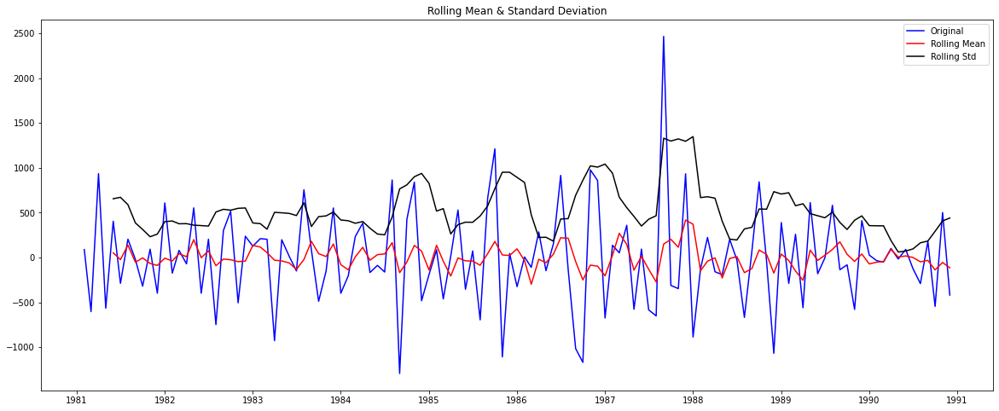

Results of Dickey-Fuller Sparkling_test:
Sparkling_test Statistic        -3.342905
p-value                          0.013066
#Lags Used                      10.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64 



In [160]:
Sparkling_test_stationarity((Sparkling_train['Sparkling'].diff(12).dropna()).diff(1).dropna())

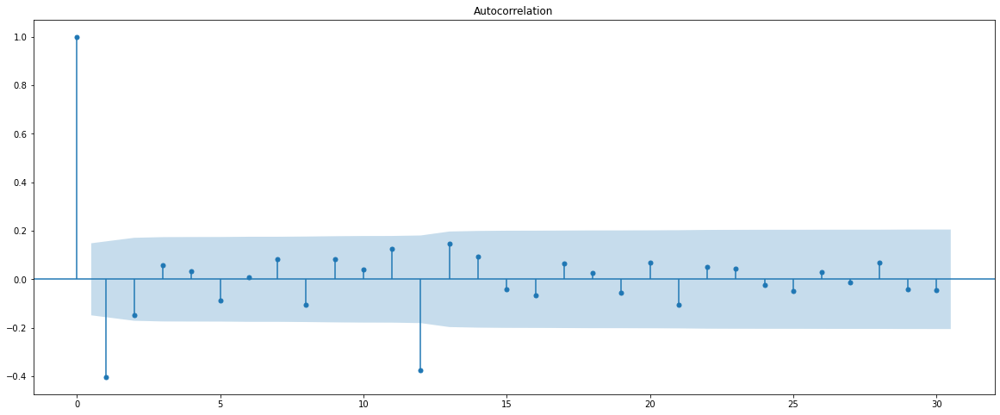

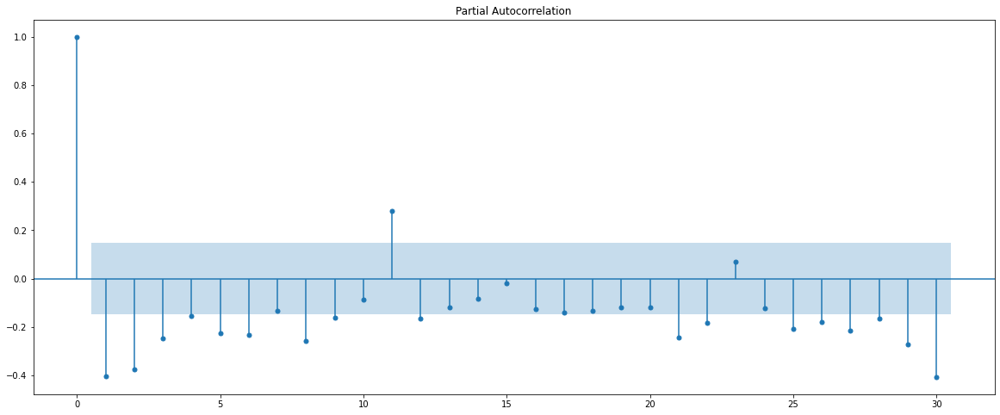

In [161]:
plot_acf((Sparkling['Sparkling'].diff(12).dropna()).diff(1).dropna(),lags=30)
plot_pacf((Sparkling['Sparkling'].diff(12).dropna()).diff(1).dropna(),lags=30);

In [162]:
import statsmodels.api as sm

manual_Sparkling_SARIMA_12 = sm.tsa.statespace.SARIMAX(Sparkling_train['Sparkling'].values,
                                order=(2, 1, 3),
                                seasonal_order=(6, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_Sparkling_SARIMA_12 = manual_Sparkling_SARIMA_12.fit(maxiter=1000)
print(results_manual_Sparkling_SARIMA_12.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                    y   No. Observations:                  132
Model:             SARIMAX(2, 1, 3)x(6, 1, [1], 12)   Log Likelihood                -333.081
Date:                              Wed, 13 Apr 2022   AIC                            692.162
Time:                                      20:41:50   BIC                            715.648
Sample:                                           0   HQIC                           700.917
                                              - 132                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.5720      0.295     -5.335      0.000      -2.150      -0.995
ar.L2         -0.74

In [166]:
results_manual_Sparkling_SARIMA_12.plot_diagnostics()
plt.show()

ValueError: Length of endogenous variable must be larger the the number of lags used in the model and the number of observations burned in the log-likelihood calculation.

<Figure size 1440x576 with 0 Axes>

# Predict on the Sparkling_test Set using this model and evaluate the model.

In [167]:
predicted_manual_Sparkling_SARIMA_12 = results_manual_Sparkling_SARIMA_12.get_forecast(steps=len(Sparkling_test))

In [168]:
predicted_manual_Sparkling_SARIMA_12.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1297.356667,432.630273,449.416914,2145.296420
1,1433.324676,528.125500,398.217718,2468.431635
2,1530.986882,528.668186,494.816277,2567.157486
3,1434.623576,596.366740,265.766244,2603.480908
4,1457.339564,602.776194,275.919933,2638.759196


In [169]:
rmse = mean_squared_error(Sparkling_test['Sparkling'],predicted_manual_Sparkling_SARIMA_12.predicted_mean,squared=False)
print(rmse)

658.1533038240277


In [170]:
temp_results_SparklingDf = pd.DataFrame({'Sparkling_test RMSE': [rmse]}
                           ,index=['SARIMA(2, 1, 3)(6,1,1,12)'])


results_SparklingDf = pd.concat([results_SparklingDf,temp_results_SparklingDf])

results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487
"Alpha=0.05,SimpleExponentialSmoothing",1316.411742
"Alpha =0.64,Beta=0,DoubleExponentialSmoothing",2007.238526


# Question 8

# Build a table (create a data frame) with all the models built along with their corresponding parameters and the respective RMSE values on the test data

In [171]:
results_SparklingDf

,Sparkling_test RMSE
RegressionOnTime,1389.135175
NaiveModel,3864.279352
SimpleAverageModel,1275.081804
2point_MovingAverage_Sparkling,3046.976092
4point_MovingAverage_Sparkling,2021.855880
6point_MovingAverage_Sparkling,1521.611250
9point_MovingAverage_Sparkling,1304.618912
"Alpha=0.005,SimpleExponentialSmoothing",1316.035487
"Alpha=0.05,SimpleExponentialSmoothing",1316.411742
"Alpha =0.64,Beta=0,DoubleExponentialSmoothing",2007.238526


Alpha=0.05,Beta=0.05,Gamma=0.25,TripleExponentialSmoothing

# Question 9

# Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands

In [172]:
fullmodel1 = ExponentialSmoothing(Sparkling,
                                  trend='additive',
                                  seasonal='multiplicative').fit(smoothing_level=0.05,
                                                                 smoothing_slope=0.05,
                                                                 smoothing_seasonal=0.25)

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\Users\User\AppData\Local\Temp/ipykernel_6320/2097486677.py:1: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  fullmodel1 = ExponentialSmoothing(Sparkling,


In [173]:
RMSE_fullmodel1 = metrics.mean_squared_error(Sparkling['Sparkling'],fullmodel1.fittedvalues,squared=False)

print('Sparkling RMSE:',RMSE_fullmodel1)

Sparkling RMSE: 353.11081605568245


In [174]:
prediction_1 = fullmodel1.forecast(steps=12)

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


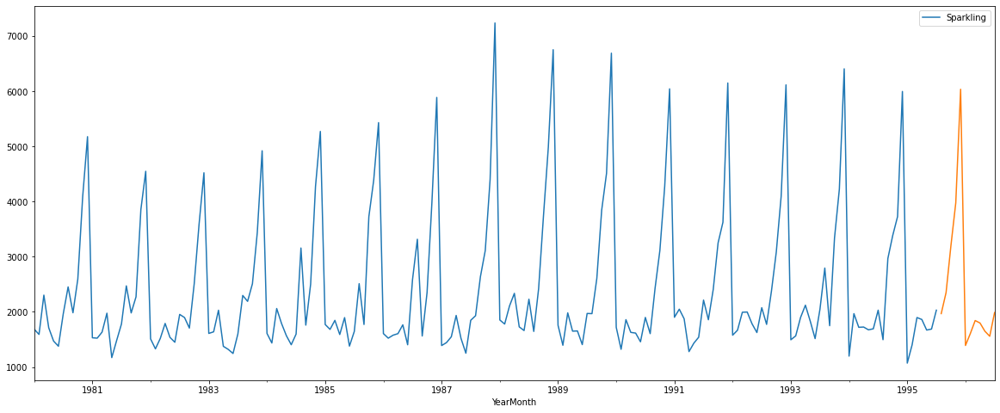

In [175]:
Sparkling.plot()
prediction_1.plot();

In [176]:
pred_1_df = pd.DataFrame({'lower_CI':prediction_1 - 1.96*np.std(fullmodel1.resid,ddof=1),
                          'prediction':prediction_1,
                          'upper_ci': prediction_1 + 1.96*np.std(fullmodel1.resid,ddof=1)})
pred_1_df.head()

,lower_CI,prediction,upper_ci
1995-08-01,1275.521240,1968.500088,2661.478937
1995-09-01,1657.100572,2350.079421,3043.058269
1995-10-01,2508.324687,3201.303535,3894.282384
1995-11-01,3284.523123,3977.501972,4670.480820
1995-12-01,5346.278735,6039.257584,6732.236432


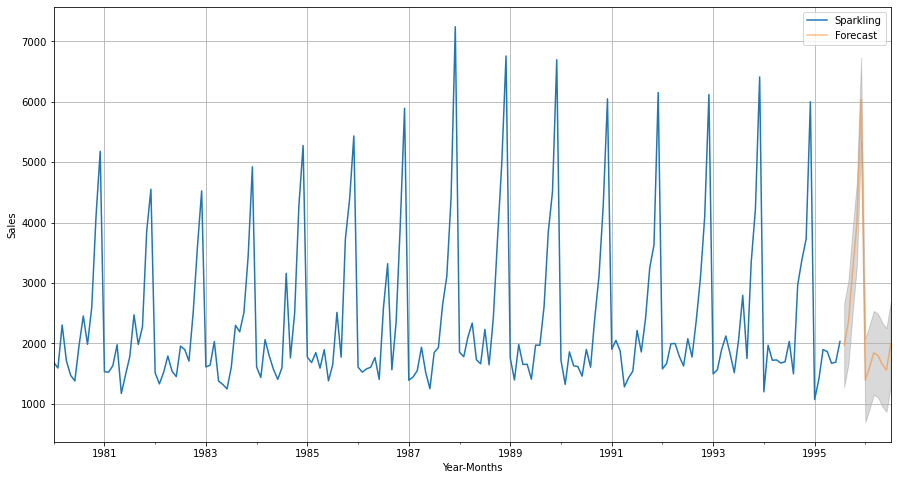

In [177]:
axis = Sparkling.plot(label='Actual', figsize=(15,8))
pred_1_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(pred_1_df.index, pred_1_df['lower_CI'], pred_1_df['upper_ci'], color='k', alpha=.15)
axis.set_xlabel('Year-Months')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.grid()
plt.show()

# Question 10

Answer in PDF